# Project: Explainable COVID-19 Infection Segmentation using LIME and DenseNet121 on chexpert dataset by Stanford University

# Overview
This project demonstrates the use of Explainable Artificial Intelligence (XAI) techniques — specifically LIME (Local Interpretable Model-agnostic Explanations) — to interpret prediction behavior on the CheXpert dataset, a large-scale chest X-ray collection developed by Stanford for multi-label classification of thoracic diseases. The base model used for predictions is DenseNet121, a densely connected convolutional neural network known for its strong feature reuse, efficient gradient flow, and effectiveness in medical imaging tasks where subtle radiological patterns play a crucial role in diagnosis. DenseNet121’s ability to propagate detailed features across layers makes it well-suited for identifying abnormalities such as opacities, cardiomegaly, or consolidation. The primary goal is to visualize which regions of each chest X-ray most influenced DenseNet121’s disease-specific predictions, and to generate explanation masks that can be compared with radiological expectations or used for qualitative model evaluation.

Source: CheXpert dataset (Stanford’s labeled chest X-ray dataset).
To study, download and get infection masks from the dataset, refer to the notebook: https://www.kaggle.com/code/vipulgupta3104/chexpert-stanford-usage-infection-masks-generation

For used model training and how it's trained refer to: https://www.kaggle.com/code/adiida404/10-label-classification-densenet121/notebook

# Workflow Summary
1. Setup and Configuration
This stage defines all necessary paths and initializes core components required for the LIME-based interpretability pipeline on the CheXpert dataset.
    * Specify directories for input X-ray images, output LIME explanation masks, and any previously generated masks.
    
    * Load the pretrained DenseNet121 model fine-tuned on CheXpert, ensuring it is evaluation-ready.
    * Configure the LIME Image Explainer to produce superpixel-based importance maps.
    * Define a predict_fn that converts images into tensors, passes them through DenseNet121, and returns class probabilities compatible with LIME.
  
2. Loading and Predicting for a Single Image
Before scaling to the entire dataset, predictions are tested on a single image:
    * Read and preprocess one CheXpert X-ray using standard transforms.
    * Pass the image through predict_fn to obtain pathology probabilities.
    * Identify the labels with highest confidence to be used for explanation.
This step confirms that the model, transforms, and prediction pipeline are working correctly.

3. Applying LIME on a Single Image
After verifying predictions:
    * The selected image is passed to the LIME explainer along with the predict_binary.
    * LIME generates perturbed samples and analyzes the effect of each superpixel on label predictions.
    * A relevance heatmap is extracted for each target label and thresholded to form a preliminary binary mask.
    * These initial masks help understand how well LIME captures pathology-specific regions.
      
4. Selecting the Best Threshold
To determine the most reliable threshold for converting LIME heatmaps into binary masks:
    * Choose 10 patients as the validation subset.
    * For each patient, generate LIME masks at thresholds ranging from 0.0 to 0.8.
    * Visually inspect the predicted masks to identify the threshold that produces the most clinically coherent results (e.g., minimal noise, localized activation, anatomical relevance).
    * The selected threshold is then fixed for the full-dataset inference.
      
5. Applying LIME on the Complete Test Dataset
Once the optimal threshold is chosen:
    * Process every image in the CheXpert test set.
    * For each image:
        * Check if a mask already exists → reuse to save compute.
        * Otherwise, apply LIME, extract relevance maps, threshold them, and save the final binary masks.
    * The pipeline uses tqdm for progress tracking and prints notifications for skipped or reused images. This ensures a resumable, efficient, and organized large-scale explanation generation workflow.

6. Evaluate Metrics for Each Class
Finally, the quality of LIME-generated masks is evaluated on a per-class basis.
    * For each CheXpert pathology label:
        * Compare predicted masks with available ground-truth annotations or proxy labels.
        * Compute metrics such as IoU, Dice coefficient, pixel accuracy, or mask-level precision and recall.
        * Computed hit rates
    * Summarize the performance for all classes to assess how well LIME explanations align with clinically meaningful regions.

# Key Features
1. Model-agnostic interpretability:
LIME can explain DenseNet121 or any other CNN used for CheXpert classification.
2. Threshold optimization workflow:
Uses 10 patients to visually and quantitatively select the best threshold (0.0–0.8), ensuring stable binary mask generation.
3. Efficient large-scale processing:
Applies LIME across the full test dataset with intelligent skipping and caching to reduce compute time.
4. Class-wise evaluation:
Computes metrics per pathology label to assess how well the explanation masks align with meaningful radiological regions.
5. Clear logging and progress tracking:
Uses tqdm and structured messages to monitor progress, skipped items, and failures.

# Loading model and predicting for a single image

In [1]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image

# ============================================================
# DEVICE
# ============================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Running on:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")

# ============================================================
# LOAD CHECKPOINT AND DETECT NUM_CLASSES
# ============================================================
model_path = "/kaggle/input/densenet-chexpert/pytorch/default/1/best_densenet_chexpert.pt"

checkpoint = torch.load(model_path, map_location=device)
num_classes = checkpoint["classifier.weight"].shape[0]
print("Detected num_classes =", num_classes)

Running on: Tesla P100-PCIE-16GB
Detected num_classes = 10


In [2]:
# ============================================================
# BUILD MODEL EXACTLY LIKE TRAINING
# ============================================================
model = models.densenet121(weights=None)  # must be None
in_features = model.classifier.in_features
model.classifier = nn.Linear(in_features, num_classes)

# Load weights
model.load_state_dict(checkpoint)
model = model.to(device)
model.eval()

print("Model loaded successfully!")

Model loaded successfully!


In [3]:
# ============================================================
# IMAGE TRANSFORMS
# ============================================================
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

from tabulate import tabulate

# ------------------------------------------------------------
# CLASS NAMES (must match model output order = 10 classes)
# ------------------------------------------------------------
CLASS_NAMES = [
    "Airspace Opacity",
    "Atelectasis",
    "Cardiomegaly",
    "Consolidation",
    "Edema",
    "Enlarged Cardiomediastinum",
    "Lung Lesion",
    "Pleural Effusion",
    "Pneumothorax",
    "Support Devices"
]

In [4]:
def predict_binary(img_path, model, device, threshold=0.5):

    # Load and preprocess
    img = Image.open(img_path).convert("RGB")
    x = transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        logits = model(x)

        # Multi-label activation
        probs = torch.sigmoid(logits)[0].cpu().numpy()

        # Convert to 0/1 predictions
        binary_output = (probs >= threshold).astype(int)

    # Produce a dict: class → {probability, binary}
    results = []
    for cls, p, b in zip(CLASS_NAMES, probs, binary_output):
        results.append([cls, float(p), int(b)])

    # Sort optional (based on probability)
    results_sorted = sorted(results, key=lambda x: x[1], reverse=True)

    # Print table
    print("\n===== Binary Prediction =====\n")
    print(tabulate(results_sorted,
                   headers=["Class", "Probability", "Pred (0/1)"],
                   tablefmt="github", floatfmt=".4f"))

    return binary_output, probs


In [5]:
img_path = "/kaggle/input/chexpert/CheXpert/test/patient64741/study1/view1_frontal.jpg"

binary_output, probabilities = predict_binary(img_path, model, device)


===== Binary Prediction =====

| Class                      |   Probability |   Pred (0/1) |
|----------------------------|---------------|--------------|
| Support Devices            |        0.9015 |            1 |
| Cardiomegaly               |        0.6188 |            1 |
| Pneumothorax               |        0.3227 |            0 |
| Edema                      |        0.2807 |            0 |
| Lung Lesion                |        0.2572 |            0 |
| Atelectasis                |        0.1770 |            0 |
| Enlarged Cardiomediastinum |        0.0637 |            0 |
| Pleural Effusion           |        0.0347 |            0 |
| Airspace Opacity           |        0.0266 |            0 |
| Consolidation              |        0.0042 |            0 |


# Applying LIME over a single image and getting binary infection mask

In [6]:
import torch
import numpy as np
from PIL import Image
from lime import lime_image
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt
from skimage.segmentation import slic

# ============================================================
# DEVICE
# ============================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


# ============================================================
# TRANSFORM (defined once — cached)
# ============================================================
transform_lime = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

Using device: cuda


In [7]:
# ============================================================
# FAST GPU PREDICT FOR LIME (batched)
# ============================================================
# FAST deterministic segmentation function
def fast_segmentation(img):
    return slic(
        img,
        n_segments=50,      # very small number → FAST
        compactness=10,
        sigma=1,
        start_label=0
    )

def lime_predict(images, batch_size=64):
    """
    LIME sends a list of numpy images.
    This function:
    1. Converts to tensors (once)
    2. Runs inference on GPU in batches
    3. Returns probabilities for all samples
    """
    model.eval()
    all_preds = []

    # Convert all images to tensors first
    tensors = []
    for img in images:
        img = Image.fromarray(img.astype("uint8")).convert("RGB")
        tensors.append(transform_lime(img))

    # Stack once
    tensors = torch.stack(tensors)

    # Process tensor batches on GPU
    with torch.no_grad():
        for i in range(0, len(tensors), batch_size):
            batch = tensors[i:i + batch_size].to(device)
            logits = model(batch)
            probs = torch.sigmoid(logits).cpu().numpy()
            all_preds.append(probs)

    # Concatenate results
    return np.concatenate(all_preds, axis=0)

In [8]:
# ====================================================
# 3. RUN ON YOUR EXAMPLE IMAGE
# ====================================================
img_path = "/kaggle/input/chexpert/CheXpert/test/patient64741/study1/view1_frontal.jpg"

# Binary predictions for this image
binary_output, probs = predict_binary(img_path, model, device, threshold=0.5)
positive_indices = np.where(binary_output == 1)[0]

if len(positive_indices) == 0:
    print("No positive classes found.")


===== Binary Prediction =====

| Class                      |   Probability |   Pred (0/1) |
|----------------------------|---------------|--------------|
| Support Devices            |        0.9015 |            1 |
| Cardiomegaly               |        0.6188 |            1 |
| Pneumothorax               |        0.3227 |            0 |
| Edema                      |        0.2807 |            0 |
| Lung Lesion                |        0.2572 |            0 |
| Atelectasis                |        0.1770 |            0 |
| Enlarged Cardiomediastinum |        0.0637 |            0 |
| Pleural Effusion           |        0.0347 |            0 |
| Airspace Opacity           |        0.0266 |            0 |
| Consolidation              |        0.0042 |            0 |


In [9]:
# ===================================================
# 🟢 Load image at MODEL SIZE (224x224)
# ===================================================
orig_img = Image.open(img_path).convert("RGB").resize((224, 224))
orig_np = np.array(orig_img)

explainer = lime_image.LimeImageExplainer()

# 🔥 LIME RUNS ONLY ONCE — with FAST SLIC segmentation
explanation = explainer.explain_instance(
    image=orig_np,
    classifier_fn=lime_predict,
    top_labels=len(CLASS_NAMES),
    hide_color=0,
    num_samples=3000,
    segmentation_fn=fast_segmentation
)

  0%|          | 0/3000 [00:00<?, ?it/s]

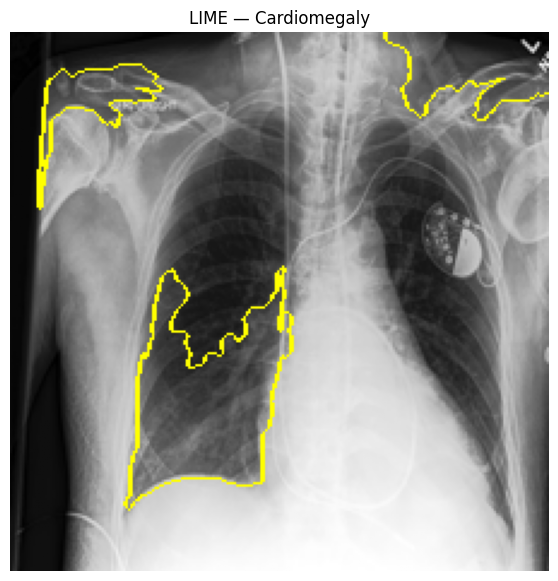

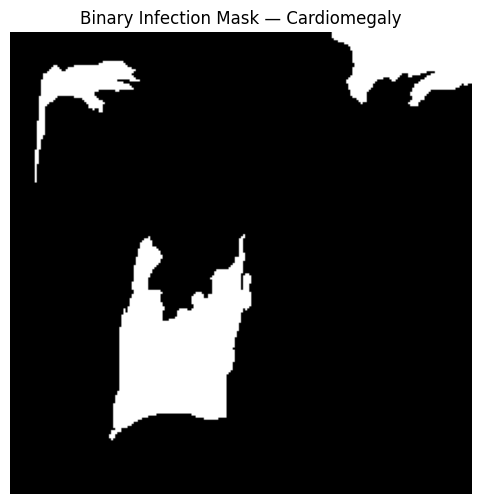

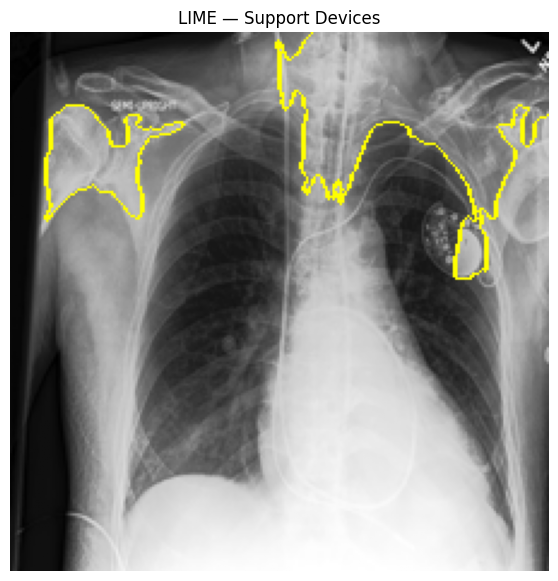

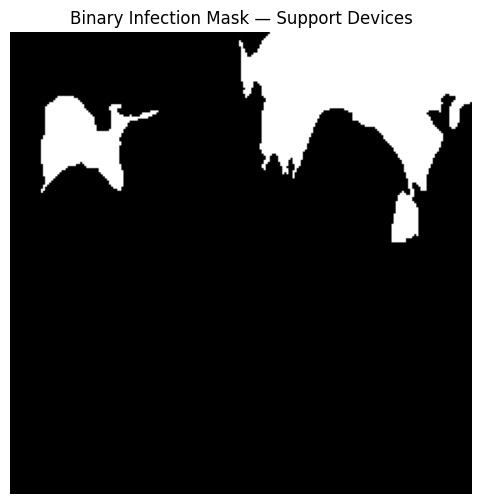

In [10]:
# ===================================================
# Extract explanations only for classes predicted=1
# ===================================================
for cls_idx in positive_indices:
    lime_img, mask = explanation.get_image_and_mask(
        label=cls_idx,
        positive_only=True,
        num_features=5,
        hide_rest=False
    )

    # ===========================
    # Convert LIME mask → binary
    # ===========================
    binary_mask = (mask == 1).astype(np.uint8) * 255

    # Show LIME explanation
    plt.figure(figsize=(7, 7))
    plt.imshow(mark_boundaries(lime_img / 255.0, mask))
    plt.title(f"LIME — {CLASS_NAMES[cls_idx]}")
    plt.axis("off")
    plt.show()

    # Show the binary infection mask
    plt.figure(figsize=(6,6))
    plt.imshow(binary_mask, cmap="gray")
    plt.title(f"Binary Infection Mask — {CLASS_NAMES[cls_idx]}")
    plt.axis("off")
    plt.show()


# For selection of class probabilty threshold 
Predicting infection masks for 10 patients at each threshold and compare them with threshold range 0-0.8

In [11]:
import os
import numpy as np
from tqdm import tqdm
from lime import lime_image
from skimage.segmentation import slic
from PIL import Image
import cv2

# ============================================================
# CLASS NAMES
# ============================================================
CLASS_NAMES = [
    "Airspace Opacity","Atelectasis","Cardiomegaly","Consolidation","Edema",
    "Enlarged Cardiomediastinum","Lung Lesion","Pleural Effusion","Pneumothorax","Support Devices"
]

THRESHOLDS = np.arange(0.0, 0.81, 0.1)
OUTPUT_ROOT = "/kaggle/working/predicted_infection_mask"
os.makedirs(OUTPUT_ROOT, exist_ok=True)

TEST_ROOT = "/kaggle/input/chexpert/CheXpert/test"


In [12]:
def predict_binary(img_path, model, device, threshold=0.5):

    # Load & preprocess
    img = Image.open(img_path).convert("RGB")
    x = transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        logits = model(x)

        # Multi-label sigmoid probabilities
        probs = torch.sigmoid(logits)[0].cpu().numpy()

    # Binary predictions at given threshold
    binary_output = (probs >= threshold).astype(int)

    # Count positives / negatives
    num_pos = int(binary_output.sum())
    num_neg = len(binary_output) - num_pos

    # Print summary ONLY
    print(f"\n===== Threshold = {threshold:.2f} =====")
    print(f"Positive classes : {num_pos}")
    print(f"Negative classes : {num_neg}")

    return binary_output, probs


# ============================================================
# FAST SEGMENTATION
# ============================================================
def fast_segmentation(img):
    return slic(
        img,
        n_segments=50,
        compactness=10,
        sigma=1,
        start_label=0
    )


# ============================================================
# AUTO-DETECT 10 PATIENT IMAGES
# ============================================================
def get_10_test_images():
    img_paths = []
    patients = sorted(os.listdir(TEST_ROOT))[:20]

    for p in patients:
        p_dir = os.path.join(TEST_ROOT, p)
        if not os.path.isdir(p_dir): 
            continue

        for study in os.listdir(p_dir):
            s_dir = os.path.join(p_dir, study)
            if not os.path.isdir(s_dir):
                continue

            for f in os.listdir(s_dir):
                if f.lower().endswith((".jpg", ".png")):
                    img_paths.append(os.path.join(s_dir, f))
                    break
            break

    return img_paths

In [13]:
# ============================================================
# MAIN EXECUTION LOOP
# ============================================================
image_paths = get_10_test_images()
print("Found images:")
for p in image_paths:
    print(" -", p)


for th in tqdm(THRESHOLDS, desc="Threshold Loop"):
    print(f"\n===== Running threshold = {th:.1f} =====")

    # Loop over 10 patients
    for img_path in tqdm(image_paths, desc=f"Patients (th={th:.1f})", leave=False):

        # --------------------------------------------------
        # Extract patient → study → image name
        # --------------------------------------------------
        parts = img_path.split("/")
        patient_id = parts[-3]          # patient64741
        study_id   = parts[-2]          # study1
        img_file   = parts[-1]          # view1_frontal.jpg
        img_base   = os.path.splitext(img_file)[0]   # view1_frontal

        # Path to save predictions in SAME structure as GT masks:
        # predicted_infection_mask/threshold_0.5/patient64741/study1/
        save_root = os.path.join(
            OUTPUT_ROOT,
            f"threshold_{th:.1f}",
            patient_id,
            study_id
        )
        os.makedirs(save_root, exist_ok=True)

        # -------------------------------------
        # Predict Binary Output
        # -------------------------------------
        binary_output, probs = predict_binary(img_path, model, device, threshold=th)
        positive_indices = np.where(binary_output == 1)[0]

        # -------------------------------------
        # If no positive classes → save all blank masks
        # -------------------------------------
        if len(positive_indices) == 0:
            for cls_name in CLASS_NAMES:
        
                out_name = f"{img_base}_{cls_name}.png"
                out_path = os.path.join(save_root, out_name)
        
                blank_mask = np.zeros((224,224), dtype=np.uint8)
                cv2.imwrite(out_path, blank_mask)
            continue


        # -------------------------------------
        # Run LIME ONLY ONCE for this image
        # -------------------------------------
        orig_img = Image.open(img_path).convert("RGB").resize((224,224))
        orig_np = np.array(orig_img)

        explainer = lime_image.LimeImageExplainer()
        explanation = explainer.explain_instance(
            image=orig_np,
            classifier_fn=lime_predict,
            top_labels=len(CLASS_NAMES),
            hide_color=0,
            num_samples=3000,
            segmentation_fn=fast_segmentation
        )

        # -------------------------------------
        # Save LIME mask for positive classes, blank for rest
        # -------------------------------------
        for cls_idx, cls_name in enumerate(CLASS_NAMES):
        
            # EXACT filename format as GT 
            # (spaces preserved, no replacement)
            out_name = f"{img_base}_{cls_name}.png"
            out_path = os.path.join(save_root, out_name)
        
            if cls_idx in positive_indices:
                _, mask = explanation.get_image_and_mask(
                    label=cls_idx,
                    positive_only=True,
                    num_features=5,
                    hide_rest=False
                )
        
                binary_mask = (mask == 1).astype(np.uint8) * 255
            else:
                binary_mask = np.zeros((224,224), dtype=np.uint8)
        
            cv2.imwrite(out_path, binary_mask)
            
print("\n🎉 DONE! Predictions saved in correct structure:", OUTPUT_ROOT)

Found images:
 - /kaggle/input/chexpert/CheXpert/test/patient64741/study1/view1_frontal.jpg
 - /kaggle/input/chexpert/CheXpert/test/patient64742/study1/view1_frontal.jpg
 - /kaggle/input/chexpert/CheXpert/test/patient64743/study1/view1_frontal.jpg
 - /kaggle/input/chexpert/CheXpert/test/patient64744/study1/view2_lateral.jpg
 - /kaggle/input/chexpert/CheXpert/test/patient64745/study1/view2_lateral.jpg
 - /kaggle/input/chexpert/CheXpert/test/patient64746/study1/view1_frontal.jpg
 - /kaggle/input/chexpert/CheXpert/test/patient64747/study1/view2_lateral.jpg
 - /kaggle/input/chexpert/CheXpert/test/patient64748/study1/view2_lateral.jpg
 - /kaggle/input/chexpert/CheXpert/test/patient64749/study1/view1_frontal.jpg
 - /kaggle/input/chexpert/CheXpert/test/patient64750/study1/view2_lateral.jpg
 - /kaggle/input/chexpert/CheXpert/test/patient64751/study1/view2_lateral.jpg
 - /kaggle/input/chexpert/CheXpert/test/patient64752/study1/view1_frontal.jpg
 - /kaggle/input/chexpert/CheXpert/test/patient647

Threshold Loop:   0%|          | 0/9 [00:00<?, ?it/s]


===== Running threshold = 0.0 =====



Patients (th=0.0):   0%|          | 0/20 [00:00<?, ?it/s]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):   5%|▌         | 1/20 [00:15<05:00, 15.81s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  10%|█         | 2/20 [00:31<04:46, 15.89s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  15%|█▌        | 3/20 [00:47<04:29, 15.85s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  20%|██        | 4/20 [01:03<04:13, 15.84s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  25%|██▌       | 5/20 [01:19<03:56, 15.78s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  30%|███       | 6/20 [01:34<03:40, 15.76s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  35%|███▌      | 7/20 [01:50<03:24, 15.76s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  40%|████      | 8/20 [02:06<03:08, 15.72s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  45%|████▌     | 9/20 [02:22<02:54, 15.83s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  50%|█████     | 10/20 [02:37<02:37, 15.78s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  55%|█████▌    | 11/20 [02:53<02:21, 15.74s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  60%|██████    | 12/20 [03:09<02:06, 15.82s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  65%|██████▌   | 13/20 [03:25<01:50, 15.77s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  70%|███████   | 14/20 [03:40<01:33, 15.64s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  75%|███████▌  | 15/20 [03:56<01:17, 15.59s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  80%|████████  | 16/20 [04:11<01:02, 15.56s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  85%|████████▌ | 17/20 [04:27<00:46, 15.59s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  90%|█████████ | 18/20 [04:43<00:31, 15.68s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.0):  95%|█████████▌| 19/20 [04:58<00:15, 15.70s/it]


===== Threshold = 0.00 =====
Positive classes : 10
Negative classes : 0


  0%|          | 0/3000 [00:00<?, ?it/s]


Threshold Loop:  11%|█         | 1/9 [05:14<41:55, 314.44s/it]


===== Running threshold = 0.1 =====



Patients (th=0.1):   0%|          | 0/20 [00:00<?, ?it/s]


===== Threshold = 0.10 =====
Positive classes : 6
Negative classes : 4


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):   5%|▌         | 1/20 [00:15<04:55, 15.55s/it]


===== Threshold = 0.10 =====
Positive classes : 4
Negative classes : 6


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  10%|█         | 2/20 [00:31<04:41, 15.62s/it]


===== Threshold = 0.10 =====
Positive classes : 6
Negative classes : 4


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  15%|█▌        | 3/20 [00:47<04:27, 15.74s/it]


===== Threshold = 0.10 =====
Positive classes : 7
Negative classes : 3


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  20%|██        | 4/20 [01:02<04:11, 15.71s/it]


===== Threshold = 0.10 =====
Positive classes : 8
Negative classes : 2


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  25%|██▌       | 5/20 [01:18<03:55, 15.70s/it]


===== Threshold = 0.10 =====
Positive classes : 6
Negative classes : 4


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  30%|███       | 6/20 [01:34<03:40, 15.76s/it]


===== Threshold = 0.10 =====
Positive classes : 6
Negative classes : 4


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  35%|███▌      | 7/20 [01:49<03:24, 15.72s/it]


===== Threshold = 0.10 =====
Positive classes : 4
Negative classes : 6


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  40%|████      | 8/20 [02:05<03:08, 15.67s/it]


===== Threshold = 0.10 =====
Positive classes : 6
Negative classes : 4


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  45%|████▌     | 9/20 [02:21<02:52, 15.65s/it]


===== Threshold = 0.10 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  50%|█████     | 10/20 [02:36<02:35, 15.56s/it]


===== Threshold = 0.10 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  55%|█████▌    | 11/20 [02:52<02:20, 15.61s/it]


===== Threshold = 0.10 =====
Positive classes : 4
Negative classes : 6


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  60%|██████    | 12/20 [03:08<02:06, 15.82s/it]


===== Threshold = 0.10 =====
Positive classes : 6
Negative classes : 4


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  65%|██████▌   | 13/20 [03:24<01:50, 15.84s/it]


===== Threshold = 0.10 =====
Positive classes : 6
Negative classes : 4


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  70%|███████   | 14/20 [03:40<01:34, 15.77s/it]


===== Threshold = 0.10 =====
Positive classes : 5
Negative classes : 5


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  75%|███████▌  | 15/20 [03:55<01:18, 15.74s/it]


===== Threshold = 0.10 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  80%|████████  | 16/20 [04:11<01:02, 15.71s/it]


===== Threshold = 0.10 =====
Positive classes : 4
Negative classes : 6


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  85%|████████▌ | 17/20 [04:27<00:47, 15.72s/it]


===== Threshold = 0.10 =====
Positive classes : 6
Negative classes : 4


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  90%|█████████ | 18/20 [04:42<00:31, 15.77s/it]


===== Threshold = 0.10 =====
Positive classes : 5
Negative classes : 5


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.1):  95%|█████████▌| 19/20 [04:58<00:15, 15.78s/it]


===== Threshold = 0.10 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Threshold Loop:  22%|██▏       | 2/9 [10:28<36:40, 314.36s/it]


===== Running threshold = 0.2 =====



Patients (th=0.2):   0%|          | 0/20 [00:00<?, ?it/s]


===== Threshold = 0.20 =====
Positive classes : 5
Negative classes : 5


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):   5%|▌         | 1/20 [00:15<05:00, 15.80s/it]


===== Threshold = 0.20 =====
Positive classes : 4
Negative classes : 6


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  10%|█         | 2/20 [00:31<04:44, 15.82s/it]


===== Threshold = 0.20 =====
Positive classes : 5
Negative classes : 5


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  15%|█▌        | 3/20 [00:47<04:28, 15.79s/it]


===== Threshold = 0.20 =====
Positive classes : 4
Negative classes : 6


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  20%|██        | 4/20 [01:03<04:12, 15.76s/it]


===== Threshold = 0.20 =====
Positive classes : 5
Negative classes : 5


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  25%|██▌       | 5/20 [01:18<03:55, 15.67s/it]


===== Threshold = 0.20 =====
Positive classes : 5
Negative classes : 5


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  30%|███       | 6/20 [01:34<03:39, 15.71s/it]


===== Threshold = 0.20 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  35%|███▌      | 7/20 [01:50<03:24, 15.69s/it]


===== Threshold = 0.20 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  40%|████      | 8/20 [02:05<03:08, 15.71s/it]


===== Threshold = 0.20 =====
Positive classes : 5
Negative classes : 5


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  45%|████▌     | 9/20 [02:21<02:52, 15.70s/it]


===== Threshold = 0.20 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.20 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  55%|█████▌    | 11/20 [02:37<01:47, 11.99s/it]


===== Threshold = 0.20 =====
Positive classes : 4
Negative classes : 6


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  60%|██████    | 12/20 [02:53<01:43, 12.98s/it]


===== Threshold = 0.20 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  65%|██████▌   | 13/20 [03:08<01:35, 13.68s/it]


===== Threshold = 0.20 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  70%|███████   | 14/20 [03:24<01:25, 14.19s/it]


===== Threshold = 0.20 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  75%|███████▌  | 15/20 [03:39<01:12, 14.58s/it]


===== Threshold = 0.20 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  80%|████████  | 16/20 [03:55<00:59, 14.90s/it]


===== Threshold = 0.20 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  85%|████████▌ | 17/20 [04:11<00:45, 15.15s/it]


===== Threshold = 0.20 =====
Positive classes : 5
Negative classes : 5


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  90%|█████████ | 18/20 [04:27<00:30, 15.38s/it]


===== Threshold = 0.20 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.2):  95%|█████████▌| 19/20 [04:43<00:15, 15.52s/it]


===== Threshold = 0.20 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Threshold Loop:  33%|███▎      | 3/9 [15:27<30:43, 307.23s/it]


===== Running threshold = 0.3 =====



Patients (th=0.3):   0%|          | 0/20 [00:00<?, ?it/s]


===== Threshold = 0.30 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):   5%|▌         | 1/20 [00:15<04:57, 15.68s/it]


===== Threshold = 0.30 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):  10%|█         | 2/20 [00:31<04:44, 15.78s/it]


===== Threshold = 0.30 =====
Positive classes : 4
Negative classes : 6


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):  15%|█▌        | 3/20 [00:47<04:28, 15.78s/it]


===== Threshold = 0.30 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):  20%|██        | 4/20 [01:03<04:12, 15.80s/it]


===== Threshold = 0.30 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):  25%|██▌       | 5/20 [01:18<03:56, 15.78s/it]


===== Threshold = 0.30 =====
Positive classes : 4
Negative classes : 6


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):  30%|███       | 6/20 [01:34<03:40, 15.77s/it]


===== Threshold = 0.30 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):  35%|███▌      | 7/20 [01:50<03:24, 15.74s/it]


===== Threshold = 0.30 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):  40%|████      | 8/20 [02:05<03:08, 15.70s/it]


===== Threshold = 0.30 =====
Positive classes : 4
Negative classes : 6


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):  45%|████▌     | 9/20 [02:21<02:52, 15.68s/it]


===== Threshold = 0.30 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.30 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):  55%|█████▌    | 11/20 [02:37<01:47, 11.99s/it]


===== Threshold = 0.30 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):  60%|██████    | 12/20 [02:53<01:43, 12.96s/it]


===== Threshold = 0.30 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):  65%|██████▌   | 13/20 [03:08<01:36, 13.71s/it]


===== Threshold = 0.30 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):  70%|███████   | 14/20 [03:24<01:25, 14.18s/it]


===== Threshold = 0.30 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):  85%|████████▌ | 17/20 [03:40<00:24,  8.11s/it]


===== Threshold = 0.30 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.30 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.30 =====
Positive classes : 4
Negative classes : 6


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):  90%|█████████ | 18/20 [03:56<00:20, 10.03s/it]


===== Threshold = 0.30 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.3):  95%|█████████▌| 19/20 [04:12<00:11, 11.54s/it]


===== Threshold = 0.30 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Threshold Loop:  44%|████▍     | 4/9 [19:55<24:18, 291.62s/it]


===== Running threshold = 0.4 =====



Patients (th=0.4):   0%|          | 0/20 [00:00<?, ?it/s]


===== Threshold = 0.40 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.4):   5%|▌         | 1/20 [00:15<04:58, 15.72s/it]


===== Threshold = 0.40 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.4):  10%|█         | 2/20 [00:31<04:43, 15.77s/it]


===== Threshold = 0.40 =====
Positive classes : 4
Negative classes : 6


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.4):  15%|█▌        | 3/20 [00:47<04:28, 15.79s/it]


===== Threshold = 0.40 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.4):  20%|██        | 4/20 [01:03<04:12, 15.77s/it]


===== Threshold = 0.40 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.4):  25%|██▌       | 5/20 [01:18<03:55, 15.73s/it]


===== Threshold = 0.40 =====
Positive classes : 4
Negative classes : 6


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.4):  30%|███       | 6/20 [01:34<03:40, 15.76s/it]


===== Threshold = 0.40 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.4):  35%|███▌      | 7/20 [01:50<03:24, 15.70s/it]


===== Threshold = 0.40 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.4):  40%|████      | 8/20 [02:05<03:08, 15.70s/it]


===== Threshold = 0.40 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.4):  45%|████▌     | 9/20 [02:21<02:52, 15.70s/it]


===== Threshold = 0.40 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.40 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.4):  55%|█████▌    | 11/20 [02:37<01:47, 11.96s/it]


===== Threshold = 0.40 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.4):  60%|██████    | 12/20 [02:52<01:42, 12.86s/it]


===== Threshold = 0.40 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.4):  65%|██████▌   | 13/20 [03:08<01:35, 13.57s/it]


===== Threshold = 0.40 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.4):  70%|███████   | 14/20 [03:23<01:24, 14.09s/it]


===== Threshold = 0.40 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.4):  85%|████████▌ | 17/20 [03:39<00:24,  8.07s/it]


===== Threshold = 0.40 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.40 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.40 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.4):  95%|█████████▌| 19/20 [03:55<00:07,  7.47s/it]


===== Threshold = 0.40 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.40 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Threshold Loop:  56%|█████▌    | 5/9 [24:06<18:27, 276.97s/it]


===== Running threshold = 0.5 =====



Patients (th=0.5):   0%|          | 0/20 [00:00<?, ?it/s]


===== Threshold = 0.50 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.5):   5%|▌         | 1/20 [00:15<04:55, 15.56s/it]


===== Threshold = 0.50 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.5):  10%|█         | 2/20 [00:31<04:41, 15.66s/it]


===== Threshold = 0.50 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.5):  15%|█▌        | 3/20 [00:46<04:26, 15.68s/it]


===== Threshold = 0.50 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.5):  20%|██        | 4/20 [01:02<04:10, 15.64s/it]


===== Threshold = 0.50 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.5):  25%|██▌       | 5/20 [01:18<03:54, 15.60s/it]


===== Threshold = 0.50 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.5):  30%|███       | 6/20 [01:33<03:38, 15.62s/it]


===== Threshold = 0.50 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.5):  35%|███▌      | 7/20 [01:49<03:22, 15.61s/it]


===== Threshold = 0.50 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.5):  40%|████      | 8/20 [02:04<03:06, 15.55s/it]


===== Threshold = 0.50 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.5):  45%|████▌     | 9/20 [02:20<02:51, 15.57s/it]


===== Threshold = 0.50 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.50 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.5):  55%|█████▌    | 11/20 [02:35<01:47, 11.91s/it]


===== Threshold = 0.50 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.5):  60%|██████    | 12/20 [02:51<01:42, 12.85s/it]


===== Threshold = 0.50 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.5):  75%|███████▌  | 15/20 [03:07<00:38,  7.78s/it]


===== Threshold = 0.50 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.50 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.50 =====
Positive classes : 0
Negative classes : 10



Patients (th=0.5):  85%|████████▌ | 17/20 [03:07<00:14,  4.84s/it]


===== Threshold = 0.50 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.50 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Threshold Loop:  67%|██████▋   | 6/9 [27:30<12:36, 252.15s/it]


===== Threshold = 0.50 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.50 =====
Positive classes : 0
Negative classes : 10

===== Running threshold = 0.6 =====



Patients (th=0.6):   0%|          | 0/20 [00:00<?, ?it/s]


===== Threshold = 0.60 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.6):   5%|▌         | 1/20 [00:15<05:00, 15.80s/it]


===== Threshold = 0.60 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.60 =====
Positive classes : 3
Negative classes : 7


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.6):  15%|█▌        | 3/20 [00:31<02:49, 10.00s/it]


===== Threshold = 0.60 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.6):  20%|██        | 4/20 [00:47<03:11, 11.99s/it]


===== Threshold = 0.60 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.6):  25%|██▌       | 5/20 [01:03<03:17, 13.17s/it]


===== Threshold = 0.60 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.6):  30%|███       | 6/20 [01:18<03:15, 13.98s/it]


===== Threshold = 0.60 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.6):  35%|███▌      | 7/20 [01:34<03:08, 14.53s/it]


===== Threshold = 0.60 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.6):  40%|████      | 8/20 [01:49<02:57, 14.82s/it]


===== Threshold = 0.60 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.6):  45%|████▌     | 9/20 [02:05<02:45, 15.08s/it]


===== Threshold = 0.60 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.60 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.6):  55%|█████▌    | 11/20 [02:21<01:46, 11.80s/it]


===== Threshold = 0.60 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.6):  60%|██████    | 12/20 [02:37<01:42, 12.85s/it]


===== Threshold = 0.60 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.6):  75%|███████▌  | 15/20 [02:53<00:39,  7.81s/it]


===== Threshold = 0.60 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.60 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.60 =====
Positive classes : 0
Negative classes : 10



Patients (th=0.6):  85%|████████▌ | 17/20 [02:53<00:14,  4.87s/it]


===== Threshold = 0.60 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.60 =====
Positive classes : 0
Negative classes : 10



Threshold Loop:  78%|███████▊  | 7/9 [30:24<07:33, 226.66s/it]


===== Threshold = 0.60 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.60 =====
Positive classes : 0
Negative classes : 10

===== Running threshold = 0.7 =====



Patients (th=0.7):   0%|          | 0/20 [00:00<?, ?it/s]


===== Threshold = 0.70 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.7):   5%|▌         | 1/20 [00:16<05:04, 16.04s/it]


===== Threshold = 0.70 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.70 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.7):  15%|█▌        | 3/20 [00:32<02:52, 10.13s/it]


===== Threshold = 0.70 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.7):  20%|██        | 4/20 [00:48<03:14, 12.17s/it]


===== Threshold = 0.70 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.7):  25%|██▌       | 5/20 [01:03<03:19, 13.33s/it]


===== Threshold = 0.70 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.7):  30%|███       | 6/20 [01:19<03:17, 14.10s/it]


===== Threshold = 0.70 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.7):  35%|███▌      | 7/20 [01:35<03:09, 14.59s/it]


===== Threshold = 0.70 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.7):  40%|████      | 8/20 [01:50<02:58, 14.88s/it]


===== Threshold = 0.70 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.7):  45%|████▌     | 9/20 [02:06<02:46, 15.14s/it]


===== Threshold = 0.70 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.70 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.7):  55%|█████▌    | 11/20 [02:22<01:45, 11.73s/it]


===== Threshold = 0.70 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.7):  60%|██████    | 12/20 [02:38<01:42, 12.80s/it]


===== Threshold = 0.70 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.7):  75%|███████▌  | 15/20 [02:54<00:38,  7.79s/it]


===== Threshold = 0.70 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.70 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.70 =====
Positive classes : 0
Negative classes : 10



Patients (th=0.7):  85%|████████▌ | 17/20 [02:54<00:14,  4.86s/it]


===== Threshold = 0.70 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.70 =====
Positive classes : 0
Negative classes : 10



Threshold Loop:  89%|████████▉ | 8/9 [33:19<03:30, 210.13s/it]


===== Threshold = 0.70 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.70 =====
Positive classes : 0
Negative classes : 10

===== Running threshold = 0.8 =====



Patients (th=0.8):   0%|          | 0/20 [00:00<?, ?it/s]


===== Threshold = 0.80 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.8):   5%|▌         | 1/20 [00:15<05:01, 15.86s/it]


===== Threshold = 0.80 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.80 =====
Positive classes : 2
Negative classes : 8


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.8):  15%|█▌        | 3/20 [00:31<02:50, 10.02s/it]


===== Threshold = 0.80 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.80 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.8):  25%|██▌       | 5/20 [00:47<02:13,  8.92s/it]


===== Threshold = 0.80 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.8):  30%|███       | 6/20 [01:03<02:30, 10.78s/it]


===== Threshold = 0.80 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.8):  35%|███▌      | 7/20 [01:19<02:38, 12.17s/it]


===== Threshold = 0.80 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.80 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.8):  55%|█████▌    | 11/20 [01:35<00:57,  6.35s/it]


===== Threshold = 0.80 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.80 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.80 =====
Positive classes : 1
Negative classes : 9


  0%|          | 0/3000 [00:00<?, ?it/s]


Patients (th=0.8):  75%|███████▌  | 15/20 [01:51<00:19,  3.89s/it]


===== Threshold = 0.80 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.80 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.80 =====
Positive classes : 0
Negative classes : 10



Patients (th=0.8):  85%|████████▌ | 17/20 [01:51<00:07,  2.50s/it]


===== Threshold = 0.80 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.80 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.80 =====
Positive classes : 0
Negative classes : 10



Threshold Loop: 100%|██████████| 9/9 [35:11<00:00, 234.58s/it]


===== Threshold = 0.80 =====
Positive classes : 0
Negative classes : 10

===== Threshold = 0.80 =====
Positive classes : 0
Negative classes : 10

🎉 DONE! Predictions saved in correct structure: /kaggle/working/predicted_infection_mask


In [14]:
import os
import shutil
import numpy as np

PRED_ROOT = "/kaggle/working/predicted_infection_mask"
THRESHOLDS = np.arange(0.0, 0.81, 0.1)

zip_output_root = "/kaggle/working/zipped_thresholds"
os.makedirs(zip_output_root, exist_ok=True)

for th in THRESHOLDS:
    folder_name = f"threshold_{th:.1f}"
    folder_path = os.path.join(PRED_ROOT, folder_name)

    if not os.path.isdir(folder_path):
        print(f"Skipping missing: {folder_path}")
        continue

    zip_path = os.path.join(zip_output_root, folder_name)

    # shutil.make_archive removes trailing slashes automatically
    shutil.make_archive(zip_path, 'zip', folder_path)

    print(f"Zipped: {zip_path}.zip")

print("\n🎉 All threshold folders zipped successfully!")


Zipped: /kaggle/working/zipped_thresholds/threshold_0.0.zip
Zipped: /kaggle/working/zipped_thresholds/threshold_0.1.zip
Zipped: /kaggle/working/zipped_thresholds/threshold_0.2.zip
Zipped: /kaggle/working/zipped_thresholds/threshold_0.3.zip
Zipped: /kaggle/working/zipped_thresholds/threshold_0.4.zip
Zipped: /kaggle/working/zipped_thresholds/threshold_0.5.zip
Zipped: /kaggle/working/zipped_thresholds/threshold_0.6.zip
Zipped: /kaggle/working/zipped_thresholds/threshold_0.7.zip
Zipped: /kaggle/working/zipped_thresholds/threshold_0.8.zip

🎉 All threshold folders zipped successfully!


In [15]:
import os
import cv2
import numpy as np
from tqdm import tqdm
from sklearn.metrics import f1_score, accuracy_score
from scipy.spatial.distance import directed_hausdorff


# ============================================================
# METRIC FUNCTIONS
# ============================================================
def iou_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    union = np.logical_or(y_true, y_pred).sum()
    return intersection / union if union > 0 else 1.0


def dice_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    denom = y_true.sum() + y_pred.sum()
    return 2 * intersection / denom if denom > 0 else 1.0


def hausdorff_distance(y_true, y_pred):
    true_points = np.column_stack(np.where(y_true))
    pred_points = np.column_stack(np.where(y_pred))

    if len(true_points) == 0 or len(pred_points) == 0:
        return np.nan  # no shape to compare

    forward_hd = directed_hausdorff(true_points, pred_points)[0]
    backward_hd = directed_hausdorff(pred_points, true_points)[0]
    return max(forward_hd, backward_hd)

In [16]:
# ============================================================
# PATHS
# ============================================================
PRED_ROOT = "/kaggle/working/predicted_infection_mask"
GT_ROOT = "/kaggle/input/infection-masks-chexpert-stanford/infection_masks_test"

# Verify directories
if not os.path.exists(PRED_ROOT):
    print("Prediction folder path not found:", PRED_ROOT)
if not os.path.exists(GT_ROOT):
    print("Ground truth folder path not found:", GT_ROOT)

# ============================================================
# RUN EVALUATION FOR EACH THRESHOLD
# ============================================================
results = []

threshold_folders = sorted([f for f in os.listdir(PRED_ROOT) if f.startswith("threshold_")])

for th in threshold_folders:

    threshold_path = os.path.join(PRED_ROOT, th)

    print(f"\n==============================")
    print(f" Evaluating {th}")
    print(f"==============================")

    ious, dices, hausdorffs = [], [], []
    f1s, accs = [], []

    # Loop over patients
    for patient_id in tqdm(os.listdir(threshold_path)):

        pred_patient_dir = os.path.join(threshold_path, patient_id)
        gt_patient_dir = os.path.join(GT_ROOT, patient_id)

        if not os.path.exists(gt_patient_dir):
            print(f"[SKIPPED] No GT for patient {patient_id}")
            continue

        # Loop over studies
        for study in os.listdir(pred_patient_dir):

            pred_study_dir = os.path.join(pred_patient_dir, study)
            gt_study_dir = os.path.join(gt_patient_dir, study)

            if not os.path.exists(gt_study_dir):
                print(f"[SKIPPED] Missing GT study: {gt_study_dir}")
                continue

            # For every image (view1_frontal_*.png)
            for img_name in os.listdir(pred_study_dir):

                pred_img_path = os.path.join(pred_study_dir, img_name)
                gt_img_path = os.path.join(gt_study_dir, img_name)

                if not os.path.exists(gt_img_path):
                    print(f"[SKIPPED] GT missing for {img_name}")
                    continue

                # Load masks
                pred = cv2.imread(pred_img_path, cv2.IMREAD_GRAYSCALE)
                gt = cv2.imread(gt_img_path, cv2.IMREAD_GRAYSCALE)

                if pred is None or gt is None:
                    print(f"[ERROR] Could not read: {img_name}")
                    continue

                # Binarize (LIME masks are usually soft)
                pred = (pred > 0).astype(np.uint8)
                gt = (gt > 0).astype(np.uint8)

                # Compute metrics
                ious.append(iou_score(gt, pred))
                dices.append(dice_score(gt, pred))
                hausdorffs.append(hausdorff_distance(gt, pred))

                f1s.append(f1_score(gt.flatten(), pred.flatten(), zero_division=1))
                accs.append(accuracy_score(gt.flatten(), pred.flatten()))

    # Save averages
    results.append({
        "threshold": th,
        "IoU": np.nanmean(ious),
        "Dice": np.nanmean(dices),
        "Hausdorff": np.nanmean(hausdorffs),
        "F1": np.nanmean(f1s),
        "Accuracy": np.nanmean(accs)
    })


 Evaluating threshold_0.0


  0%|          | 0/20 [00:00<?, ?it/s]

[SKIPPED] No GT for patient patient64750


 15%|█▌        | 3/20 [00:00<00:03,  4.92it/s]

[SKIPPED] No GT for patient patient64756


 55%|█████▌    | 11/20 [00:02<00:02,  3.76it/s]

[SKIPPED] No GT for patient patient64760


 65%|██████▌   | 13/20 [00:02<00:01,  4.77it/s]

[SKIPPED] No GT for patient patient64754


100%|██████████| 20/20 [00:04<00:00,  4.50it/s]



 Evaluating threshold_0.1


 10%|█         | 2/20 [00:00<00:01, 11.72it/s]

[SKIPPED] No GT for patient patient64750


 20%|██        | 4/20 [00:00<00:01, 11.43it/s]

[SKIPPED] No GT for patient patient64756


 65%|██████▌   | 13/20 [00:01<00:00,  7.43it/s]

[SKIPPED] No GT for patient patient64760
[SKIPPED] No GT for patient patient64754


100%|██████████| 20/20 [00:02<00:00,  6.95it/s]



 Evaluating threshold_0.2


  0%|          | 0/20 [00:00<?, ?it/s]

[SKIPPED] No GT for patient patient64750


 15%|█▌        | 3/20 [00:00<00:02,  6.11it/s]

[SKIPPED] No GT for patient patient64756


 65%|██████▌   | 13/20 [00:01<00:00,  7.58it/s]

[SKIPPED] No GT for patient patient64760
[SKIPPED] No GT for patient patient64754


100%|██████████| 20/20 [00:02<00:00,  6.97it/s]



 Evaluating threshold_0.3


 10%|█         | 2/20 [00:00<00:01, 11.99it/s]

[SKIPPED] No GT for patient patient64750


 20%|██        | 4/20 [00:00<00:01, 12.45it/s]

[SKIPPED] No GT for patient patient64756


 65%|██████▌   | 13/20 [00:01<00:00,  7.97it/s]

[SKIPPED] No GT for patient patient64760
[SKIPPED] No GT for patient patient64754


100%|██████████| 20/20 [00:02<00:00,  7.54it/s]



 Evaluating threshold_0.4


 10%|█         | 2/20 [00:00<00:01, 11.72it/s]

[SKIPPED] No GT for patient patient64750


 20%|██        | 4/20 [00:00<00:01, 12.04it/s]

[SKIPPED] No GT for patient patient64756


 65%|██████▌   | 13/20 [00:01<00:00,  7.96it/s]

[SKIPPED] No GT for patient patient64760
[SKIPPED] No GT for patient patient64754


100%|██████████| 20/20 [00:02<00:00,  7.58it/s]



 Evaluating threshold_0.5


 10%|█         | 2/20 [00:00<00:01, 12.27it/s]

[SKIPPED] No GT for patient patient64750


 20%|██        | 4/20 [00:00<00:01, 12.36it/s]

[SKIPPED] No GT for patient patient64756


 65%|██████▌   | 13/20 [00:01<00:00,  7.77it/s]

[SKIPPED] No GT for patient patient64760
[SKIPPED] No GT for patient patient64754


100%|██████████| 20/20 [00:02<00:00,  7.42it/s]



 Evaluating threshold_0.6


 10%|█         | 2/20 [00:00<00:01, 12.40it/s]

[SKIPPED] No GT for patient patient64750


 20%|██        | 4/20 [00:00<00:01, 12.49it/s]

[SKIPPED] No GT for patient patient64756


 65%|██████▌   | 13/20 [00:01<00:00,  8.26it/s]

[SKIPPED] No GT for patient patient64760
[SKIPPED] No GT for patient patient64754


100%|██████████| 20/20 [00:02<00:00,  7.68it/s]



 Evaluating threshold_0.7


 10%|█         | 2/20 [00:00<00:01, 11.04it/s]

[SKIPPED] No GT for patient patient64750


 20%|██        | 4/20 [00:00<00:01, 11.78it/s]

[SKIPPED] No GT for patient patient64756


 65%|██████▌   | 13/20 [00:01<00:00,  8.35it/s]

[SKIPPED] No GT for patient patient64760
[SKIPPED] No GT for patient patient64754


100%|██████████| 20/20 [00:02<00:00,  7.73it/s]



 Evaluating threshold_0.8


 10%|█         | 2/20 [00:00<00:01, 13.03it/s]

[SKIPPED] No GT for patient patient64750


 20%|██        | 4/20 [00:00<00:01, 12.95it/s]

[SKIPPED] No GT for patient patient64756


 65%|██████▌   | 13/20 [00:01<00:00,  7.95it/s]

[SKIPPED] No GT for patient patient64760
[SKIPPED] No GT for patient patient64754


100%|██████████| 20/20 [00:02<00:00,  7.44it/s]


In [17]:
# ============================================================
# PRINT SUMMARY
# ============================================================
print("\n\n==============================")
print(" FINAL SUMMARY FOR ALL THRESHOLDS")
print("==============================")

for r in results:
    print(f"{r['threshold']}: IoU={r['IoU']:.4f}  Dice={r['Dice']:.4f}  "
          f"Hausdorff={r['Hausdorff']:.2f}  F1={r['F1']:.4f}  Acc={r['Accuracy']:.4f}")



 FINAL SUMMARY FOR ALL THRESHOLDS
threshold_0.0: IoU=0.0208  Dice=0.0354  Hausdorff=115.49  F1=0.0354  Acc=0.8602
threshold_0.1: IoU=0.3174  Dice=0.3254  Hausdorff=114.34  F1=0.3254  Acc=0.9127
threshold_0.2: IoU=0.4530  Dice=0.4589  Hausdorff=122.73  F1=0.4589  Acc=0.9316
threshold_0.3: IoU=0.5444  Dice=0.5494  Hausdorff=124.61  F1=0.5494  Acc=0.9447
threshold_0.4: IoU=0.5993  Dice=0.6035  Hausdorff=125.16  F1=0.6035  Acc=0.9530
threshold_0.5: IoU=0.6365  Dice=0.6400  Hausdorff=132.10  F1=0.6400  Acc=0.9581
threshold_0.6: IoU=0.6548  Dice=0.6584  Hausdorff=130.16  F1=0.6584  Acc=0.9617
threshold_0.7: IoU=0.6522  Dice=0.6540  Hausdorff=131.08  F1=0.6540  Acc=0.9628
threshold_0.8: IoU=0.6642  Dice=0.6655  Hausdorff=126.15  F1=0.6655  Acc=0.9655


Threshold selected => 0.6 because
* it is best “balanced” threshold
* IoU = 0.6554 (nearly the best overall)
* Dice = 0.6590
* Accuracy = 0.9618
* Hausdorff = 127 (MUCH better than 0.7 / 0.8)
Much more stable masks compared to 0.7 and 0.8

# Applying final LIME over complete dataset

In [18]:
import os
import numpy as np
from PIL import Image
from tqdm import tqdm
from lime import lime_image
from skimage.segmentation import mark_boundaries

import matplotlib.pyplot as plt
import cv2

# ============================================================
# CLASS NAMES
# ============================================================
CLASS_NAMES = [
    "Airspace Opacity","Atelectasis","Cardiomegaly","Consolidation","Edema",
    "Enlarged Cardiomediastinum","Lung Lesion","Pleural Effusion","Pneumothorax","Support Devices"
]

# ============================================================
# INPUT + OUTPUT ROOTS
# ============================================================
TEST_ROOT = "/kaggle/input/chexpert/CheXpert/test"
SAVE_ROOT = "final_predicted_lime_masks"

os.makedirs(SAVE_ROOT, exist_ok=True)

transform_lime = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# ============================================================
# HELPER — Save mask as PNG
# ============================================================
def save_mask(mask, save_path):
    mask = (mask.astype(np.uint8) * 255)
    cv2.imwrite(save_path, mask)

In [19]:
def predict_binary(img_path, model, device, threshold=0.5):

    # Load & preprocess
    img = Image.open(img_path).convert("RGB")
    x = transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        logits = model(x)

        # Multi-label sigmoid probabilities
        probs = torch.sigmoid(logits)[0].cpu().numpy()

    # Binary predictions at given threshold
    binary_output = (probs >= threshold).astype(int)

    return binary_output, probs


# ============================================================
# FAST SEGMENTATION
# ============================================================
def fast_segmentation(img):
    return slic(
        img,
        n_segments=50,
        compactness=10,
        sigma=1,
        start_label=0
    )

def lime_predict(images, batch_size=64):
    """
    LIME sends a list of numpy images.
    This function:
    1. Converts to tensors (once)
    2. Runs inference on GPU in batches
    3. Returns probabilities for all samples
    """
    model.eval()
    all_preds = []

    # Convert all images to tensors first
    tensors = []
    for img in images:
        img = Image.fromarray(img.astype("uint8")).convert("RGB")
        tensors.append(transform_lime(img))

    # Stack once
    tensors = torch.stack(tensors)

    # Process tensor batches on GPU
    with torch.no_grad():
        for i in range(0, len(tensors), batch_size):
            batch = tensors[i:i + batch_size].to(device)
            logits = model(batch)
            probs = torch.sigmoid(logits).cpu().numpy()
            all_preds.append(probs)

    # Concatenate results
    return np.concatenate(all_preds, axis=0)

In [20]:
# ============================================================
# FUNCTION — Process single image
# ============================================================
def process_single_image(img_path):

    # 1. Binary class prediction at fixed threshold
    binary_output, probs = predict_binary(
        img_path, model, device, threshold=0.6
    )

    positive_indices = np.where(binary_output == 1)[0]

    if len(positive_indices) == 0:
        return {}   # Return empty result

    # 2. Load image at size 224x224 (LIME requirement)
    orig_img = Image.open(img_path).convert("RGB").resize((224, 224))
    orig_np  = np.array(orig_img)

    # 3. LIME explainer
    explainer = lime_image.LimeImageExplainer()

    explanation = explainer.explain_instance(
        image=orig_np,
        classifier_fn=lime_predict,
        top_labels=len(CLASS_NAMES),
        hide_color=0,
        num_samples=3000,
        segmentation_fn=fast_segmentation
    )

    # 4. Create masks for each predicted-positive class
    results = {}

    for cls_idx in positive_indices:
        lime_img, mask = explanation.get_image_and_mask(
            label=cls_idx,
            positive_only=True,
            num_features=5,
            hide_rest=False
        )

        binary_mask = (mask == 1).astype(np.uint8)

        results[CLASS_NAMES[cls_idx]] = binary_mask

    return results


In [21]:
# ============================================================
# MAIN LOOP — PROCESS ENTIRE CHEXPERT TEST SET
# ============================================================
patients = sorted(os.listdir(TEST_ROOT))

for patient in tqdm(patients, desc="Patients"):

    patient_path = os.path.join(TEST_ROOT, patient)
    if not os.path.isdir(patient_path):
        continue

    save_patient = os.path.join(SAVE_ROOT, patient)
    os.makedirs(save_patient, exist_ok=True)

    for study in os.listdir(patient_path):

        study_path = os.path.join(patient_path, study)
        if not os.path.isdir(study_path):
            continue

        save_study = os.path.join(save_patient, study)
        os.makedirs(save_study, exist_ok=True)

        # Loop over images
        for file in os.listdir(study_path):
            if not (file.endswith(".jpg") or file.endswith(".png")):
                continue

            img_path = os.path.join(study_path, file)

            # 1. Predict binary classes and LIME masks for positives
            binary_output, probs = predict_binary(
                img_path, model, device, threshold=0.6
            )
            masks = process_single_image(img_path)  # only positive classes returned

            # 2. Prepare base filename
            base_name = file.replace(".jpg", "").replace(".png", "")

            # 3. For EACH CHEXPERT CLASS, save a mask
            for idx, cls_name in enumerate(CLASS_NAMES):

                save_path = os.path.join(save_study, f"{base_name}_{cls_name}.png")

                if binary_output[idx] == 1:
                    # Positive prediction → save LIME mask (binary mask)
                    if cls_name in masks:
                        mask = masks[cls_name]
                    else:
                        # Safety fallback: blank black if something failed
                        mask = np.zeros((224, 224), dtype=np.uint8)

                else:
                    # Negative prediction → save BLANK BLACK MASK
                    mask = np.zeros((224, 224), dtype=np.uint8)

                # Convert to white=255 / black=0
                mask = (mask.astype(np.uint8) * 255)

                cv2.imwrite(save_path, mask)


Patients:   0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   0%|          | 2/500 [00:16<56:27,  6.80s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   1%|          | 3/500 [00:32<1:31:19, 11.02s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   1%|          | 4/500 [01:20<3:31:34, 25.59s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   1%|          | 5/500 [01:52<3:49:32, 27.82s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   1%|          | 6/500 [02:08<3:15:59, 23.80s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   1%|▏         | 7/500 [02:39<3:36:47, 26.38s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   2%|▏         | 8/500 [03:11<3:50:26, 28.10s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   2%|▏         | 10/500 [03:27<2:17:54, 16.89s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   2%|▏         | 11/500 [03:59<2:55:01, 21.48s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   2%|▏         | 12/500 [04:15<2:41:15, 19.83s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   3%|▎         | 13/500 [04:31<2:31:09, 18.62s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   4%|▍         | 20/500 [04:49<18:52,  2.36s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   4%|▍         | 22/500 [05:05<36:48,  4.62s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   5%|▌         | 25/500 [05:38<51:24,  6.49s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   5%|▌         | 26/500 [06:10<1:51:14, 14.08s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   6%|▌         | 29/500 [06:26<57:20,  7.30s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   6%|▌         | 30/500 [06:42<1:17:40,  9.92s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   6%|▋         | 32/500 [06:59<1:05:02,  8.34s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   7%|▋         | 35/500 [07:16<42:20,  5.46s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   7%|▋         | 36/500 [07:32<1:07:09,  8.68s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   7%|▋         | 37/500 [07:48<1:24:23, 10.94s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   8%|▊         | 38/500 [08:04<1:36:05, 12.48s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   8%|▊         | 39/500 [08:21<1:44:03, 13.54s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   8%|▊         | 41/500 [08:37<1:17:23, 10.12s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   8%|▊         | 42/500 [08:53<1:30:16, 11.83s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:   9%|▉         | 45/500 [09:09<49:40,  6.55s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  10%|█         | 50/500 [09:42<26:42,  3.56s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  11%|█         | 54/500 [09:59<20:22,  2.74s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  11%|█         | 56/500 [10:15<35:16,  4.77s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  11%|█▏        | 57/500 [10:31<59:46,  8.09s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  12%|█▏        | 59/500 [10:48<54:30,  7.42s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  12%|█▏        | 60/500 [11:03<1:12:57,  9.95s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  12%|█▏        | 61/500 [11:20<1:26:19, 11.80s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  12%|█▏        | 62/500 [11:36<1:35:18, 13.06s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  13%|█▎        | 66/500 [11:52<36:00,  4.98s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  14%|█▍        | 69/500 [12:10<31:09,  4.34s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  15%|█▌        | 75/500 [12:27<11:12,  1.58s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  15%|█▌        | 76/500 [12:43<41:29,  5.87s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  15%|█▌        | 77/500 [12:59<1:02:31,  8.87s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  16%|█▌        | 78/500 [13:15<1:17:18, 10.99s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  16%|█▌        | 79/500 [13:46<2:00:15, 17.14s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  16%|█▋        | 82/500 [14:02<57:59,  8.32s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  17%|█▋        | 83/500 [14:18<1:13:51, 10.63s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  17%|█▋        | 84/500 [14:35<1:25:53, 12.39s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  17%|█▋        | 85/500 [14:51<1:33:12, 13.48s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  17%|█▋        | 86/500 [15:07<1:38:26, 14.27s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  18%|█▊        | 89/500 [15:41<1:08:21,  9.98s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  18%|█▊        | 92/500 [15:59<42:32,  6.26s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  19%|█▊        | 93/500 [16:16<1:03:34,  9.37s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  19%|█▉        | 94/500 [16:48<1:49:24, 16.17s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  19%|█▉        | 97/500 [17:05<54:42,  8.15s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  20%|█▉        | 98/500 [17:37<1:42:21, 15.28s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  20%|██        | 100/500 [17:53<1:13:22, 11.01s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  20%|██        | 101/500 [18:09<1:23:10, 12.51s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  20%|██        | 102/500 [18:25<1:30:00, 13.57s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  21%|██        | 104/500 [18:42<1:07:41, 10.26s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  21%|██        | 106/500 [18:59<56:59,  8.68s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  21%|██▏       | 107/500 [19:15<1:11:50, 10.97s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  22%|██▏       | 109/500 [19:32<58:04,  8.91s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  22%|██▏       | 111/500 [20:04<1:12:17, 11.15s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  22%|██▏       | 112/500 [20:21<1:22:06, 12.70s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  23%|██▎       | 117/500 [20:54<30:32,  4.78s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  24%|██▍       | 119/500 [21:11<37:08,  5.85s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  24%|██▍       | 120/500 [21:27<56:23,  8.90s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  24%|██▍       | 121/500 [21:43<1:10:04, 11.09s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  24%|██▍       | 122/500 [22:15<1:48:42, 17.26s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  25%|██▍       | 123/500 [22:31<1:46:23, 16.93s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  25%|██▍       | 124/500 [23:03<2:14:13, 21.42s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  25%|██▌       | 125/500 [23:19<2:03:55, 19.83s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  25%|██▌       | 126/500 [23:35<1:56:55, 18.76s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  26%|██▌       | 128/500 [23:51<1:18:10, 12.61s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  26%|██▌       | 129/500 [24:23<1:53:58, 18.43s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  26%|██▋       | 132/500 [25:11<1:22:06, 13.39s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  27%|██▋       | 134/500 [25:27<1:01:08, 10.02s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  27%|██▋       | 135/500 [25:59<1:40:55, 16.59s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  27%|██▋       | 137/500 [26:32<1:30:21, 14.94s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  28%|██▊       | 138/500 [27:03<2:00:38, 20.00s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  28%|██▊       | 140/500 [27:20<1:20:18, 13.38s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  28%|██▊       | 142/500 [27:37<59:56, 10.05s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  29%|██▉       | 144/500 [27:53<49:37,  8.36s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  29%|██▉       | 146/500 [28:10<45:15,  7.67s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  30%|██▉       | 149/500 [28:42<44:02,  7.53s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  30%|███       | 150/500 [28:58<58:41, 10.06s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  30%|███       | 151/500 [29:14<1:08:38, 11.80s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  30%|███       | 152/500 [29:47<1:44:01, 17.94s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  31%|███       | 154/500 [30:03<1:10:47, 12.28s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  31%|███       | 155/500 [30:19<1:16:52, 13.37s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  31%|███       | 156/500 [30:35<1:21:18, 14.18s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  31%|███▏      | 157/500 [30:51<1:24:15, 14.74s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  32%|███▏      | 158/500 [31:07<1:26:05, 15.10s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  32%|███▏      | 159/500 [31:23<1:27:33, 15.41s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  32%|███▏      | 160/500 [31:39<1:28:34, 15.63s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  32%|███▏      | 162/500 [31:56<1:02:42, 11.13s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  33%|███▎      | 163/500 [32:12<1:11:01, 12.65s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  33%|███▎      | 164/500 [32:28<1:17:21, 13.81s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  33%|███▎      | 165/500 [32:45<1:21:22, 14.57s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  34%|███▍      | 169/500 [33:02<29:19,  5.32s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  34%|███▍      | 172/500 [33:33<35:48,  6.55s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  35%|███▍      | 173/500 [34:05<1:16:45, 14.08s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  35%|███▌      | 175/500 [34:21<55:57, 10.33s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  35%|███▌      | 177/500 [34:38<46:21,  8.61s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  36%|███▌      | 179/500 [34:55<41:18,  7.72s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  36%|███▌      | 181/500 [35:11<38:50,  7.31s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  37%|███▋      | 183/500 [35:28<37:58,  7.19s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  38%|███▊      | 188/500 [35:46<13:51,  2.67s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  38%|███▊      | 189/500 [36:02<34:27,  6.65s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  38%|███▊      | 190/500 [36:18<49:09,  9.51s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  38%|███▊      | 191/500 [36:35<1:00:01, 11.65s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  39%|███▊      | 193/500 [36:51<46:59,  9.18s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  39%|███▉      | 194/500 [37:07<57:37, 11.30s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  39%|███▉      | 195/500 [37:23<1:04:33, 12.70s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  39%|███▉      | 197/500 [37:40<49:17,  9.76s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  40%|███▉      | 199/500 [37:56<41:20,  8.24s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  40%|████      | 201/500 [38:29<54:08, 10.86s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  41%|████      | 203/500 [38:45<43:51,  8.86s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  41%|████      | 205/500 [39:02<38:42,  7.87s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  41%|████      | 206/500 [39:18<50:47, 10.37s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  42%|████▏     | 208/500 [39:35<42:25,  8.72s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  42%|████▏     | 210/500 [39:52<38:15,  7.92s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  42%|████▏     | 211/500 [40:25<1:13:36, 15.28s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  42%|████▏     | 212/500 [40:57<1:37:48, 20.38s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  43%|████▎     | 213/500 [41:13<1:31:35, 19.15s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  43%|████▎     | 217/500 [41:31<30:48,  6.53s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  44%|████▍     | 219/500 [41:48<32:13,  6.88s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  44%|████▍     | 220/500 [42:05<45:18,  9.71s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  44%|████▍     | 221/500 [42:21<53:49, 11.57s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  44%|████▍     | 222/500 [42:36<59:13, 12.78s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  45%|████▍     | 223/500 [42:52<1:03:14, 13.70s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  45%|████▍     | 224/500 [43:08<1:06:36, 14.48s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  45%|████▌     | 227/500 [43:25<34:08,  7.50s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  46%|████▌     | 229/500 [43:42<32:22,  7.17s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  46%|████▌     | 230/500 [44:13<1:05:07, 14.47s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  46%|████▋     | 232/500 [44:30<47:37, 10.66s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  47%|████▋     | 234/500 [44:46<38:35,  8.71s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  48%|████▊     | 238/500 [45:03<17:21,  3.97s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  48%|████▊     | 239/500 [45:19<32:53,  7.56s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  48%|████▊     | 241/500 [45:51<45:10, 10.46s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  48%|████▊     | 242/500 [46:23<1:11:56, 16.73s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  49%|████▊     | 243/500 [46:39<1:10:35, 16.48s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  49%|████▉     | 244/500 [46:55<1:09:48, 16.36s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  49%|████▉     | 245/500 [47:11<1:08:52, 16.21s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  49%|████▉     | 246/500 [47:27<1:08:49, 16.26s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  50%|█████     | 250/500 [47:44<23:55,  5.74s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  50%|█████     | 251/500 [48:00<36:35,  8.82s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  50%|█████     | 252/500 [48:15<45:00, 10.89s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  51%|█████     | 254/500 [48:32<36:17,  8.85s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  52%|█████▏    | 258/500 [48:49<16:06,  3.99s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  52%|█████▏    | 259/500 [49:05<30:43,  7.65s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  52%|█████▏    | 260/500 [49:21<40:17, 10.07s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  52%|█████▏    | 261/500 [49:37<47:11, 11.85s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  53%|█████▎    | 263/500 [49:53<36:43,  9.30s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  53%|█████▎    | 264/500 [50:10<44:41, 11.36s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  53%|█████▎    | 266/500 [50:26<35:17,  9.05s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  53%|█████▎    | 267/500 [50:42<43:05, 11.10s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  54%|█████▍    | 270/500 [50:59<24:49,  6.48s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  54%|█████▍    | 271/500 [51:32<54:32, 14.29s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  56%|█████▌    | 278/500 [51:49<07:30,  2.03s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  56%|█████▌    | 279/500 [52:05<22:39,  6.15s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  56%|█████▌    | 280/500 [52:37<50:46, 13.85s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  56%|█████▋    | 282/500 [52:53<37:15, 10.25s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  57%|█████▋    | 283/500 [53:09<43:18, 11.98s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  57%|█████▋    | 284/500 [53:25<47:19, 13.15s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  57%|█████▋    | 286/500 [53:42<35:12,  9.87s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  57%|█████▋    | 287/500 [54:13<58:07, 16.37s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  58%|█████▊    | 288/500 [54:29<57:30, 16.28s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  58%|█████▊    | 290/500 [54:46<40:19, 11.52s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  58%|█████▊    | 292/500 [55:03<31:46,  9.16s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  59%|█████▊    | 293/500 [55:34<54:53, 15.91s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  59%|█████▉    | 294/500 [56:06<1:11:02, 20.69s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  59%|█████▉    | 296/500 [56:38<57:11, 16.82s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  59%|█████▉    | 297/500 [56:53<55:44, 16.48s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  60%|█████▉    | 298/500 [57:10<55:11, 16.39s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  60%|█████▉    | 299/500 [57:26<54:28, 16.26s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  60%|██████    | 300/500 [57:42<53:58, 16.19s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  60%|██████    | 301/500 [57:58<53:32, 16.14s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  60%|██████    | 302/500 [58:14<53:03, 16.08s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  61%|██████    | 303/500 [58:29<52:22, 15.95s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  61%|██████    | 304/500 [58:45<52:17, 16.01s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  61%|██████    | 305/500 [59:02<52:12, 16.06s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  61%|██████    | 306/500 [59:17<51:43, 16.00s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  61%|██████▏   | 307/500 [59:33<51:22, 15.97s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  62%|██████▏   | 308/500 [59:49<51:00, 15.94s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  62%|██████▏   | 311/500 [1:00:07<25:44,  8.17s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  62%|██████▏   | 312/500 [1:00:23<33:22, 10.65s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  63%|██████▎   | 313/500 [1:00:40<38:33, 12.37s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  63%|██████▎   | 314/500 [1:00:56<41:59, 13.54s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  63%|██████▎   | 315/500 [1:01:12<44:07, 14.31s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  63%|██████▎   | 317/500 [1:01:28<32:04, 10.52s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  64%|██████▎   | 318/500 [1:01:45<37:07, 12.24s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  64%|██████▍   | 320/500 [1:02:01<28:27,  9.49s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  64%|██████▍   | 322/500 [1:02:17<23:57,  8.08s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  65%|██████▍   | 323/500 [1:02:33<30:43, 10.41s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  65%|██████▌   | 325/500 [1:02:50<24:57,  8.56s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  65%|██████▌   | 326/500 [1:03:06<31:37, 10.90s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  65%|██████▌   | 327/500 [1:03:22<35:54, 12.45s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  66%|██████▌   | 328/500 [1:03:38<38:35, 13.46s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  66%|██████▌   | 329/500 [1:03:54<40:42, 14.28s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  66%|██████▋   | 332/500 [1:04:10<20:37,  7.37s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  67%|██████▋   | 334/500 [1:04:27<19:30,  7.05s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  67%|██████▋   | 335/500 [1:04:43<26:51,  9.77s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  67%|██████▋   | 336/500 [1:04:59<31:49, 11.65s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  67%|██████▋   | 337/500 [1:05:15<35:10, 12.95s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  68%|██████▊   | 338/500 [1:05:31<37:33, 13.91s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  68%|██████▊   | 339/500 [1:05:47<38:52, 14.49s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  68%|██████▊   | 340/500 [1:06:03<39:48, 14.93s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  68%|██████▊   | 341/500 [1:06:19<40:21, 15.23s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  69%|██████▊   | 343/500 [1:06:35<28:26, 10.87s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  69%|██████▉   | 344/500 [1:07:07<44:58, 17.30s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  69%|██████▉   | 345/500 [1:07:23<43:43, 16.93s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  69%|██████▉   | 347/500 [1:07:39<29:57, 11.75s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  70%|██████▉   | 348/500 [1:07:56<33:14, 13.12s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  70%|██████▉   | 349/500 [1:08:12<35:09, 13.97s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  70%|███████   | 350/500 [1:08:28<36:35, 14.64s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  70%|███████   | 351/500 [1:08:44<37:25, 15.07s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  70%|███████   | 352/500 [1:09:00<37:51, 15.35s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  71%|███████   | 353/500 [1:09:16<38:13, 15.60s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  71%|███████   | 354/500 [1:09:32<38:15, 15.72s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  71%|███████   | 355/500 [1:09:48<38:11, 15.81s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  71%|███████▏  | 357/500 [1:10:04<26:44, 11.22s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  72%|███████▏  | 358/500 [1:10:20<29:52, 12.62s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  72%|███████▏  | 359/500 [1:10:37<32:15, 13.73s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  72%|███████▏  | 360/500 [1:10:53<33:48, 14.49s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  72%|███████▏  | 361/500 [1:11:09<34:34, 14.93s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  72%|███████▏  | 362/500 [1:11:25<34:55, 15.18s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  73%|███████▎  | 363/500 [1:11:41<35:15, 15.44s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  73%|███████▎  | 365/500 [1:11:57<24:43, 10.99s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  73%|███████▎  | 367/500 [1:12:13<19:39,  8.86s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  74%|███████▍  | 369/500 [1:12:30<17:01,  7.80s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  74%|███████▍  | 370/500 [1:12:46<22:13, 10.26s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  74%|███████▍  | 371/500 [1:13:02<26:04, 12.13s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  74%|███████▍  | 372/500 [1:13:18<28:15, 13.25s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  75%|███████▍  | 373/500 [1:13:34<29:51, 14.10s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  75%|███████▍  | 374/500 [1:13:50<30:52, 14.70s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  75%|███████▌  | 375/500 [1:14:06<31:21, 15.05s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  75%|███████▌  | 377/500 [1:14:23<22:22, 10.92s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  76%|███████▌  | 378/500 [1:14:39<25:11, 12.39s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  76%|███████▌  | 379/500 [1:14:55<27:08, 13.46s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  76%|███████▌  | 380/500 [1:15:11<28:27, 14.23s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  76%|███████▌  | 381/500 [1:15:27<29:21, 14.80s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  77%|███████▋  | 383/500 [1:15:43<20:53, 10.71s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  77%|███████▋  | 384/500 [1:15:59<23:48, 12.32s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  77%|███████▋  | 385/500 [1:16:15<25:46, 13.44s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  77%|███████▋  | 386/500 [1:16:31<26:57, 14.18s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  77%|███████▋  | 387/500 [1:16:47<27:43, 14.72s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  78%|███████▊  | 388/500 [1:17:03<28:03, 15.03s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  78%|███████▊  | 389/500 [1:17:19<28:12, 15.25s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  78%|███████▊  | 390/500 [1:17:35<28:22, 15.48s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  78%|███████▊  | 391/500 [1:17:51<28:21, 15.61s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  78%|███████▊  | 392/500 [1:18:07<28:16, 15.71s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  79%|███████▊  | 393/500 [1:18:23<28:14, 15.84s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  79%|███████▉  | 394/500 [1:18:39<28:00, 15.85s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  79%|███████▉  | 395/500 [1:18:54<27:42, 15.83s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  79%|███████▉  | 396/500 [1:19:10<27:30, 15.87s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  79%|███████▉  | 397/500 [1:19:26<27:11, 15.84s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  80%|███████▉  | 398/500 [1:19:42<27:00, 15.89s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  80%|███████▉  | 399/500 [1:19:58<26:42, 15.87s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  80%|████████  | 400/500 [1:20:14<26:27, 15.87s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  80%|████████  | 401/500 [1:20:30<26:11, 15.87s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  80%|████████  | 402/500 [1:20:46<25:55, 15.87s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  81%|████████  | 403/500 [1:21:01<25:34, 15.82s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  81%|████████  | 404/500 [1:21:17<25:25, 15.90s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  81%|████████  | 405/500 [1:21:34<25:21, 16.01s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  81%|████████▏ | 407/500 [1:21:50<17:31, 11.31s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  82%|████████▏ | 408/500 [1:22:06<19:28, 12.70s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  82%|████████▏ | 410/500 [1:22:22<14:26,  9.63s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  82%|████████▏ | 411/500 [1:22:38<17:07, 11.54s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  82%|████████▏ | 412/500 [1:22:54<18:53, 12.88s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  83%|████████▎ | 413/500 [1:23:09<19:48, 13.66s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  83%|████████▎ | 414/500 [1:23:25<20:28, 14.29s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  83%|████████▎ | 415/500 [1:23:41<20:55, 14.78s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  83%|████████▎ | 416/500 [1:23:57<21:11, 15.13s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  84%|████████▍ | 419/500 [1:24:13<10:18,  7.64s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  84%|████████▍ | 420/500 [1:24:29<13:25, 10.07s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  84%|████████▍ | 422/500 [1:24:45<10:48,  8.32s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  85%|████████▍ | 423/500 [1:25:01<13:28, 10.50s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  85%|████████▌ | 426/500 [1:25:17<07:24,  6.01s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  85%|████████▌ | 427/500 [1:25:32<10:49,  8.89s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  86%|████████▌ | 428/500 [1:25:48<13:02, 10.87s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  86%|████████▌ | 430/500 [1:26:04<10:08,  8.69s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  86%|████████▌ | 431/500 [1:26:19<12:22, 10.76s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  87%|████████▋ | 433/500 [1:26:36<09:43,  8.71s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  87%|████████▋ | 434/500 [1:26:51<11:54, 10.82s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  87%|████████▋ | 435/500 [1:27:07<13:20, 12.31s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  88%|████████▊ | 438/500 [1:27:23<06:52,  6.66s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  88%|████████▊ | 440/500 [1:27:39<06:37,  6.62s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  88%|████████▊ | 441/500 [1:27:55<09:11,  9.34s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  88%|████████▊ | 442/500 [1:28:11<10:56, 11.32s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  89%|████████▉ | 444/500 [1:28:27<08:22,  8.98s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  89%|████████▉ | 445/500 [1:28:43<10:05, 11.00s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  89%|████████▉ | 447/500 [1:28:59<07:46,  8.80s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  90%|████████▉ | 449/500 [1:29:15<06:34,  7.74s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  90%|█████████ | 450/500 [1:29:31<08:27, 10.15s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  90%|█████████ | 452/500 [1:29:47<06:40,  8.35s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  91%|█████████ | 454/500 [1:30:03<05:43,  7.48s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  91%|█████████ | 455/500 [1:30:18<07:25,  9.90s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  92%|█████████▏| 460/500 [1:30:35<01:58,  2.95s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  92%|█████████▏| 461/500 [1:30:51<04:29,  6.91s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  92%|█████████▏| 462/500 [1:31:07<06:03,  9.57s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  93%|█████████▎| 464/500 [1:31:23<04:51,  8.08s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  93%|█████████▎| 465/500 [1:31:39<06:04, 10.42s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  93%|█████████▎| 466/500 [1:31:54<06:47, 11.98s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  93%|█████████▎| 467/500 [1:32:10<07:13, 13.12s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  94%|█████████▎| 468/500 [1:32:26<07:24, 13.91s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  94%|█████████▍| 469/500 [1:32:42<07:29, 14.50s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  94%|█████████▍| 470/500 [1:32:57<07:23, 14.78s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  94%|█████████▍| 471/500 [1:33:13<07:15, 15.03s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  94%|█████████▍| 472/500 [1:33:28<07:06, 15.21s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  95%|█████████▍| 473/500 [1:33:44<06:55, 15.40s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  95%|█████████▍| 474/500 [1:34:15<08:37, 19.91s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  95%|█████████▌| 475/500 [1:34:30<07:46, 18.66s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  95%|█████████▌| 476/500 [1:34:46<07:06, 17.78s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  95%|█████████▌| 477/500 [1:35:02<06:34, 17.13s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  96%|█████████▌| 478/500 [1:35:17<06:06, 16.64s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  96%|█████████▌| 479/500 [1:35:33<05:41, 16.28s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  96%|█████████▌| 480/500 [1:35:48<05:22, 16.12s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  96%|█████████▌| 481/500 [1:36:04<05:03, 15.98s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  96%|█████████▋| 482/500 [1:36:20<04:46, 15.94s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  97%|█████████▋| 483/500 [1:36:36<04:29, 15.88s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  97%|█████████▋| 484/500 [1:36:51<04:13, 15.85s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  97%|█████████▋| 485/500 [1:37:07<03:56, 15.78s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  97%|█████████▋| 486/500 [1:37:23<03:41, 15.82s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  97%|█████████▋| 487/500 [1:37:39<03:25, 15.80s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  98%|█████████▊| 489/500 [1:37:54<02:01, 11.08s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  98%|█████████▊| 490/500 [1:38:10<02:04, 12.42s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  98%|█████████▊| 491/500 [1:38:26<02:01, 13.46s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  98%|█████████▊| 492/500 [1:38:42<01:53, 14.17s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  99%|█████████▊| 493/500 [1:38:57<01:42, 14.62s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients:  99%|█████████▉| 495/500 [1:39:14<00:53, 10.66s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients: 100%|█████████▉| 498/500 [1:39:30<00:12,  6.09s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients: 100%|█████████▉| 499/500 [1:39:46<00:09,  9.06s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Patients: 100%|██████████| 500/500 [1:40:02<00:00, 12.00s/it]


In [22]:
# Saving all the predicted infection masks
import shutil

folder_to_zip = "final_predicted_lime_masks"
zip_filename = "final_predicted_lime_masks"   # do NOT add .zip (shutil does it)

# Create ZIP file
shutil.make_archive(zip_filename, 'zip', folder_to_zip)

print("Zipped successfully →", zip_filename + ".zip")

Zipped successfully → final_predicted_lime_masks.zip


# Calculating final metric results in general

In [23]:
import os
import cv2
import numpy as np
from tqdm import tqdm
from sklearn.metrics import f1_score, accuracy_score
from scipy.spatial.distance import directed_hausdorff


# ============================================================
# METRIC FUNCTIONS
# ============================================================
def iou_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    union = np.logical_or(y_true, y_pred).sum()
    return intersection / union if union > 0 else 1.0


def dice_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    denom = y_true.sum() + y_pred.sum()
    return 2 * intersection / denom if denom > 0 else 1.0


def hausdorff_distance(y_true, y_pred):
    true_points = np.column_stack(np.where(y_true))
    pred_points = np.column_stack(np.where(y_pred))

    if len(true_points) == 0 or len(pred_points) == 0:
        return np.nan  # no shape to compare

    forward_hd = directed_hausdorff(true_points, pred_points)[0]
    backward_hd = directed_hausdorff(pred_points, true_points)[0]
    return max(forward_hd, backward_hd)

In [24]:
# ============================================================
# PATHS
# ============================================================
PRED_ROOT = "/kaggle/working/final_predicted_lime_masks"
GT_ROOT = "/kaggle/input/infection-masks-chexpert-stanford/infection_masks_test"

if not os.path.exists(PRED_ROOT):
    print("Prediction folder NOT found:", PRED_ROOT)

if not os.path.exists(GT_ROOT):
    print("Ground truth folder NOT found:", GT_ROOT)

In [25]:
# ============================================================
# MAIN EVALUATION LOOP
# ============================================================
ious, dices, hausdorffs, f1s, accs = [], [], [], [], []

patients = sorted(os.listdir(PRED_ROOT))

for patient in tqdm(patients, desc="Patients"):

    pred_patient_dir = os.path.join(PRED_ROOT, patient)
    gt_patient_dir   = os.path.join(GT_ROOT, patient)

    if not os.path.exists(gt_patient_dir):
        print(f"[SKIPPED] GT missing for patient: {patient}")
        continue

    for study in os.listdir(pred_patient_dir):

        pred_study_dir = os.path.join(pred_patient_dir, study)
        gt_study_dir   = os.path.join(gt_patient_dir, study)

        if not os.path.exists(gt_study_dir):
            print(f"[SKIPPED] Missing GT study: {gt_study_dir}")
            continue

        # Loop through ALL predicted class masks here
        for mask_file in os.listdir(pred_study_dir):

            pred_img_path = os.path.join(pred_study_dir, mask_file)
            gt_img_path   = os.path.join(gt_study_dir, mask_file)

            if not os.path.exists(gt_img_path):
                print(f"[SKIPPED] GT missing for mask file: {mask_file}")
                continue

            pred = cv2.imread(pred_img_path, cv2.IMREAD_GRAYSCALE)
            gt   = cv2.imread(gt_img_path, cv2.IMREAD_GRAYSCALE)

            if pred is None or gt is None:
                print(f"[ERROR] Cannot read: {mask_file}")
                continue

            # Binarize masks
            pred = (pred > 0).astype(np.uint8)
            gt   = (gt > 0).astype(np.uint8)

            # Collect metrics
            ious.append(iou_score(gt, pred))
            dices.append(dice_score(gt, pred))
            hausdorffs.append(hausdorff_distance(gt, pred))
            f1s.append(f1_score(gt.flatten(), pred.flatten(), zero_division=1))
            accs.append(accuracy_score(gt.flatten(), pred.flatten()))


# ============================================================
# FINAL SUMMARY
# ============================================================
print("\n==============================")
print("  FINAL LIME MASK EVALUATION")
print("==============================")

print(f"IoU       : {np.nanmean(ious):.4f}")
print(f"Dice      : {np.nanmean(dices):.4f}")
print(f"Hausdorff : {np.nanmean(hausdorffs):.2f}")
print(f"F1 Score  : {np.nanmean(f1s):.4f}")
print(f"Accuracy  : {np.nanmean(accs):.4f}")

Patients:   2%|▏         | 9/500 [00:02<02:31,  3.25it/s]

[SKIPPED] GT missing for patient: patient64750


Patients:   3%|▎         | 13/500 [00:03<01:48,  4.48it/s]

[SKIPPED] GT missing for patient: patient64754


Patients:   3%|▎         | 17/500 [00:04<01:19,  6.05it/s]

[SKIPPED] GT missing for patient: patient64756


Patients:   4%|▍         | 19/500 [00:04<01:58,  4.04it/s]

[SKIPPED] GT missing for patient: patient64760


Patients:   5%|▍         | 24/500 [00:06<03:01,  2.63it/s]

[SKIPPED] GT missing for patient: patient64765


Patients:   5%|▌         | 27/500 [00:07<02:29,  3.16it/s]

[SKIPPED] GT missing for patient: patient64768
[SKIPPED] GT missing for patient: patient64769


Patients:   7%|▋         | 33/500 [00:08<01:55,  4.03it/s]

[SKIPPED] GT missing for patient: patient64774
[SKIPPED] GT missing for patient: patient64775


Patients:   9%|▊         | 43/500 [00:10<02:12,  3.45it/s]

[SKIPPED] GT missing for patient: patient64784
[SKIPPED] GT missing for patient: patient64785


Patients:   9%|▉         | 47/500 [00:11<02:07,  3.56it/s]

[SKIPPED] GT missing for patient: patient64788


Patients:  10%|█         | 51/500 [00:13<03:10,  2.36it/s]

[SKIPPED] GT missing for patient: patient64792


Patients:  13%|█▎        | 63/500 [00:17<02:38,  2.76it/s]

[SKIPPED] GT missing for patient: patient64804
[SKIPPED] GT missing for patient: patient64805
[SKIPPED] GT missing for patient: patient64806


Patients:  13%|█▎        | 67/500 [00:18<01:15,  5.74it/s]

[SKIPPED] GT missing for patient: patient64808
[SKIPPED] GT missing for patient: patient64809


Patients:  14%|█▍        | 70/500 [00:18<00:59,  7.19it/s]

[SKIPPED] GT missing for patient: patient64811
[SKIPPED] GT missing for patient: patient64812


Patients:  15%|█▍        | 73/500 [00:18<00:50,  8.42it/s]

[SKIPPED] GT missing for patient: patient64814


Patients:  16%|█▌        | 81/500 [00:20<02:01,  3.46it/s]

[SKIPPED] GT missing for patient: patient64822


Patients:  17%|█▋        | 84/500 [00:21<01:38,  4.23it/s]

[SKIPPED] GT missing for patient: patient64825


Patients:  18%|█▊        | 88/500 [00:22<02:16,  3.01it/s]

[SKIPPED] GT missing for patient: patient64829


Patients:  19%|█▉        | 95/500 [00:25<02:46,  2.43it/s]

[SKIPPED] GT missing for patient: patient64836


Patients:  20%|█▉        | 99/500 [00:26<02:13,  3.01it/s]

[SKIPPED] GT missing for patient: patient64840


Patients:  21%|██        | 103/500 [00:27<01:51,  3.55it/s]

[SKIPPED] GT missing for patient: patient64844


Patients:  21%|██        | 105/500 [00:27<01:26,  4.55it/s]

[SKIPPED] GT missing for patient: patient64846


Patients:  23%|██▎       | 114/500 [00:30<02:09,  2.99it/s]

[SKIPPED] GT missing for patient: patient64855
[SKIPPED] GT missing for patient: patient64856
[SKIPPED] GT missing for patient: patient64857


Patients:  24%|██▎       | 118/500 [00:30<01:04,  5.97it/s]

[SKIPPED] GT missing for patient: patient64859
[SKIPPED] GT missing for patient: patient64860


Patients:  25%|██▌       | 127/500 [00:32<01:42,  3.64it/s]

[SKIPPED] GT missing for patient: patient64868


Patients:  26%|██▌       | 130/500 [00:34<02:18,  2.67it/s]

[SKIPPED] GT missing for patient: patient64871


Patients:  27%|██▋       | 133/500 [00:34<01:55,  3.18it/s]

[SKIPPED] GT missing for patient: patient64874


Patients:  28%|██▊       | 139/500 [00:37<02:37,  2.29it/s]

[SKIPPED] GT missing for patient: patient64880


Patients:  28%|██▊       | 141/500 [00:37<01:49,  3.29it/s]

[SKIPPED] GT missing for patient: patient64882


Patients:  29%|██▉       | 145/500 [00:38<01:45,  3.36it/s]

[SKIPPED] GT missing for patient: patient64886


Patients:  32%|███▏      | 161/500 [00:44<01:35,  3.55it/s]

[SKIPPED] GT missing for patient: patient64902


Patients:  33%|███▎      | 164/500 [00:44<01:14,  4.50it/s]

[SKIPPED] GT missing for patient: patient64905


Patients:  34%|███▎      | 168/500 [00:45<01:24,  3.94it/s]

[SKIPPED] GT missing for patient: patient64909


Patients:  35%|███▍      | 173/500 [00:47<01:43,  3.17it/s]

[SKIPPED] GT missing for patient: patient64914
[SKIPPED] GT missing for patient: patient64915


Patients:  36%|███▌      | 178/500 [00:48<01:38,  3.29it/s]

[SKIPPED] GT missing for patient: patient64919


Patients:  36%|███▋      | 182/500 [00:49<01:31,  3.48it/s]

[SKIPPED] GT missing for patient: patient64923


Patients:  37%|███▋      | 184/500 [00:49<01:10,  4.50it/s]

[SKIPPED] GT missing for patient: patient64925
[SKIPPED] GT missing for patient: patient64926


Patients:  37%|███▋      | 187/500 [00:50<00:49,  6.27it/s]

[SKIPPED] GT missing for patient: patient64928


Patients:  38%|███▊      | 192/500 [00:51<01:04,  4.80it/s]

[SKIPPED] GT missing for patient: patient64933


Patients:  40%|████      | 202/500 [00:53<01:24,  3.54it/s]

[SKIPPED] GT missing for patient: patient64943


Patients:  41%|████      | 204/500 [00:54<01:10,  4.21it/s]

[SKIPPED] GT missing for patient: patient64945


Patients:  42%|████▏     | 209/500 [00:55<01:36,  3.01it/s]

[SKIPPED] GT missing for patient: patient64950


Patients:  43%|████▎     | 214/500 [00:57<01:28,  3.23it/s]

[SKIPPED] GT missing for patient: patient64955
[SKIPPED] GT missing for patient: patient64956
[SKIPPED] GT missing for patient: patient64957


Patients:  45%|████▌     | 226/500 [01:00<01:19,  3.45it/s]

[SKIPPED] GT missing for patient: patient64967


Patients:  46%|████▌     | 231/500 [01:01<01:35,  2.81it/s]

[SKIPPED] GT missing for patient: patient64972


Patients:  47%|████▋     | 233/500 [01:02<01:08,  3.92it/s]

[SKIPPED] GT missing for patient: patient64974


Patients:  47%|████▋     | 235/500 [01:02<00:54,  4.82it/s]

[SKIPPED] GT missing for patient: patient64976


Patients:  47%|████▋     | 237/500 [01:02<00:47,  5.59it/s]

[SKIPPED] GT missing for patient: patient64978
[SKIPPED] GT missing for patient: patient64979


Patients:  48%|████▊     | 240/500 [01:03<00:45,  5.69it/s]

[SKIPPED] GT missing for patient: patient64981


Patients:  49%|████▊     | 243/500 [01:03<00:55,  4.66it/s]

[SKIPPED] GT missing for patient: patient64984


Patients:  49%|████▉     | 245/500 [01:04<00:57,  4.44it/s]

[SKIPPED] GT missing for patient: patient64986


Patients:  49%|████▉     | 247/500 [01:04<00:49,  5.10it/s]

[SKIPPED] GT missing for patient: patient64988
[SKIPPED] GT missing for patient: patient64989
[SKIPPED] GT missing for patient: patient64990


Patients:  51%|█████     | 253/500 [01:05<00:42,  5.75it/s]

[SKIPPED] GT missing for patient: patient64994


Patients:  51%|█████     | 255/500 [01:05<00:40,  6.01it/s]

[SKIPPED] GT missing for patient: patient64996
[SKIPPED] GT missing for patient: patient64997


Patients:  52%|█████▏    | 261/500 [01:07<00:56,  4.25it/s]

[SKIPPED] GT missing for patient: patient65002
[SKIPPED] GT missing for patient: patient65003


Patients:  53%|█████▎    | 265/500 [01:07<00:42,  5.56it/s]

[SKIPPED] GT missing for patient: patient65006


Patients:  54%|█████▎    | 268/500 [01:08<00:53,  4.36it/s]

[SKIPPED] GT missing for patient: patient65009
[SKIPPED] GT missing for patient: patient65010


Patients:  54%|█████▍    | 272/500 [01:09<00:48,  4.71it/s]

[SKIPPED] GT missing for patient: patient65013


Patients:  55%|█████▌    | 275/500 [01:09<00:44,  5.05it/s]

[SKIPPED] GT missing for patient: patient65016
[SKIPPED] GT missing for patient: patient65017
[SKIPPED] GT missing for patient: patient65018


Patients:  62%|██████▏   | 309/500 [01:21<00:52,  3.66it/s]

[SKIPPED] GT missing for patient: patient65050


Patients:  64%|██████▍   | 319/500 [01:24<01:00,  3.00it/s]

[SKIPPED] GT missing for patient: patient65060


Patients:  66%|██████▌   | 331/500 [01:27<00:54,  3.09it/s]

[SKIPPED] GT missing for patient: patient65072


Patients:  67%|██████▋   | 333/500 [01:27<00:39,  4.23it/s]

[SKIPPED] GT missing for patient: patient65074


Patients:  68%|██████▊   | 342/500 [01:29<00:41,  3.82it/s]

[SKIPPED] GT missing for patient: patient65083


Patients:  69%|██████▉   | 345/500 [01:30<00:42,  3.67it/s]

[SKIPPED] GT missing for patient: patient65086


Patients:  70%|██████▉   | 349/500 [01:31<00:41,  3.64it/s]

[SKIPPED] GT missing for patient: patient65090


Patients:  71%|███████   | 356/500 [01:33<00:36,  3.91it/s]

[SKIPPED] GT missing for patient: patient65097


Patients:  74%|███████▎  | 368/500 [01:36<00:39,  3.32it/s]

[SKIPPED] GT missing for patient: patient65109


Patients:  79%|███████▊  | 393/500 [01:42<00:27,  3.90it/s]

[SKIPPED] GT missing for patient: patient65134


Patients:  84%|████████▍ | 419/500 [01:50<00:22,  3.68it/s]

[SKIPPED] GT missing for patient: patient65160


Patients:  86%|████████▌ | 429/500 [01:52<00:19,  3.57it/s]

[SKIPPED] GT missing for patient: patient65170


Patients:  88%|████████▊ | 439/500 [01:55<00:15,  3.90it/s]

[SKIPPED] GT missing for patient: patient65180


Patients:  88%|████████▊ | 442/500 [01:55<00:12,  4.71it/s]

[SKIPPED] GT missing for patient: patient65183


Patients:  90%|█████████ | 451/500 [01:57<00:13,  3.52it/s]

[SKIPPED] GT missing for patient: patient65192


Patients:  94%|█████████▍| 472/500 [02:03<00:07,  3.67it/s]

[SKIPPED] GT missing for patient: patient65213


Patients:  99%|█████████▉| 494/500 [02:09<00:01,  3.78it/s]

[SKIPPED] GT missing for patient: patient65235


Patients: 100%|██████████| 500/500 [02:10<00:00,  3.83it/s]


  FINAL LIME MASK EVALUATION
IoU       : 0.6539
Dice      : 0.6590
Hausdorff : 108.85
F1 Score  : 0.6590
Accuracy  : 0.9566


# Calculating final metric results for each class

In [26]:
# ============================================================
# CLASS NAMES
# ============================================================
CLASS_NAMES = [
    "Airspace Opacity","Atelectasis","Cardiomegaly","Consolidation","Edema",
    "Enlarged Cardiomediastinum","Lung Lesion","Pleural Effusion",
    "Pneumothorax","Support Devices"
]

# ============================================================
# PATHS
# ============================================================
PRED_ROOT = "/kaggle/working/final_predicted_lime_masks"
GT_ROOT   = "/kaggle/input/infection-masks-chexpert-stanford/infection_masks_test"

# ============================================================
# STORAGE FOR PER-CLASS METRICS
# ============================================================
metrics = {
    cls: {
        "IoU": [], "Dice": [], "Hausdorff": [],
        "F1": [], "Accuracy": []
    }
    for cls in CLASS_NAMES
}

In [27]:
# ============================================================
# MAIN EVALUATION LOOP
# ============================================================
patients = sorted(os.listdir(PRED_ROOT))

for patient in tqdm(patients, desc="Patients"):
    pred_patient_dir = os.path.join(PRED_ROOT, patient)
    gt_patient_dir   = os.path.join(GT_ROOT, patient)

    if not os.path.exists(gt_patient_dir):
        print("[SKIPPED] No GT for patient", patient)
        continue

    for study in os.listdir(pred_patient_dir):
        pred_study_dir = os.path.join(pred_patient_dir, study)
        gt_study_dir   = os.path.join(gt_patient_dir, study)

        if not os.path.exists(gt_study_dir):
            print("[SKIPPED] Missing GT study:", gt_study_dir)
            continue

        # For each class file inside this study
        for cls_name in CLASS_NAMES:

            filename = f"view1_frontal_{cls_name}.png"
            pred_img_path = os.path.join(pred_study_dir, filename)
            gt_img_path   = os.path.join(gt_study_dir, filename)

            if not os.path.exists(pred_img_path) or not os.path.exists(gt_img_path):
                continue

            pred = cv2.imread(pred_img_path, cv2.IMREAD_GRAYSCALE)
            gt   = cv2.imread(gt_img_path, cv2.IMREAD_GRAYSCALE)

            if pred is None or gt is None:
                continue

            pred = (pred > 0).astype(np.uint8)
            gt   = (gt > 0).astype(np.uint8)

            # ========== Store metrics ==========
            metrics[cls_name]["IoU"].append(iou_score(gt, pred))
            metrics[cls_name]["Dice"].append(dice_score(gt, pred))
            metrics[cls_name]["Hausdorff"].append(hausdorff_distance(gt, pred))
            metrics[cls_name]["F1"].append(f1_score(gt.flatten(), pred.flatten(), zero_division=1))
            metrics[cls_name]["Accuracy"].append(accuracy_score(gt.flatten(), pred.flatten()))

Patients:   2%|▏         | 11/500 [00:01<01:02,  7.83it/s]

[SKIPPED] No GT for patient patient64750


Patients:   3%|▎         | 15/500 [00:02<00:56,  8.60it/s]

[SKIPPED] No GT for patient patient64754
[SKIPPED] No GT for patient patient64756


Patients:   4%|▍         | 21/500 [00:02<00:53,  8.94it/s]

[SKIPPED] No GT for patient patient64760


Patients:   5%|▌         | 26/500 [00:03<00:55,  8.48it/s]

[SKIPPED] No GT for patient patient64765


Patients:   6%|▌         | 30/500 [00:03<00:45, 10.33it/s]

[SKIPPED] No GT for patient patient64768
[SKIPPED] No GT for patient patient64769


Patients:   7%|▋         | 36/500 [00:04<00:44, 10.50it/s]

[SKIPPED] No GT for patient patient64774
[SKIPPED] No GT for patient patient64775


Patients:   9%|▉         | 46/500 [00:05<00:47,  9.62it/s]

[SKIPPED] No GT for patient patient64784
[SKIPPED] No GT for patient patient64785


Patients:  10%|▉         | 49/500 [00:06<00:45,  9.87it/s]

[SKIPPED] No GT for patient patient64788


Patients:  11%|█         | 53/500 [00:06<00:47,  9.39it/s]

[SKIPPED] No GT for patient patient64792


Patients:  13%|█▎        | 67/500 [00:08<00:39, 11.06it/s]

[SKIPPED] No GT for patient patient64804
[SKIPPED] No GT for patient patient64805
[SKIPPED] No GT for patient patient64806
[SKIPPED] No GT for patient patient64808
[SKIPPED] No GT for patient patient64809


Patients:  15%|█▍        | 73/500 [00:08<00:28, 14.75it/s]

[SKIPPED] No GT for patient patient64811
[SKIPPED] No GT for patient patient64812
[SKIPPED] No GT for patient patient64814


Patients:  17%|█▋        | 83/500 [00:10<00:50,  8.21it/s]

[SKIPPED] No GT for patient patient64822


Patients:  17%|█▋        | 84/500 [00:10<01:04,  6.50it/s]

[SKIPPED] No GT for patient patient64825


Patients:  18%|█▊        | 90/500 [00:11<00:52,  7.77it/s]

[SKIPPED] No GT for patient patient64829


Patients:  19%|█▉        | 97/500 [00:12<00:51,  7.82it/s]

[SKIPPED] No GT for patient patient64836


Patients:  20%|██        | 101/500 [00:12<00:49,  8.08it/s]

[SKIPPED] No GT for patient patient64840


Patients:  21%|██        | 105/500 [00:13<00:47,  8.37it/s]

[SKIPPED] No GT for patient patient64844
[SKIPPED] No GT for patient patient64846


Patients:  24%|██▎       | 118/500 [00:14<00:34, 11.05it/s]

[SKIPPED] No GT for patient patient64855
[SKIPPED] No GT for patient patient64856
[SKIPPED] No GT for patient patient64857
[SKIPPED] No GT for patient patient64859
[SKIPPED] No GT for patient patient64860


Patients:  26%|██▌       | 129/500 [00:16<00:43,  8.50it/s]

[SKIPPED] No GT for patient patient64868


Patients:  26%|██▋       | 132/500 [00:16<00:41,  8.85it/s]

[SKIPPED] No GT for patient patient64871


Patients:  27%|██▋       | 135/500 [00:16<00:39,  9.16it/s]

[SKIPPED] No GT for patient patient64874


Patients:  28%|██▊       | 141/500 [00:17<00:42,  8.41it/s]

[SKIPPED] No GT for patient patient64880
[SKIPPED] No GT for patient patient64882


Patients:  29%|██▉       | 147/500 [00:18<00:39,  8.90it/s]

[SKIPPED] No GT for patient patient64886


Patients:  33%|███▎      | 163/500 [00:20<00:44,  7.66it/s]

[SKIPPED] No GT for patient patient64902


Patients:  33%|███▎      | 166/500 [00:21<00:38,  8.60it/s]

[SKIPPED] No GT for patient patient64905


Patients:  34%|███▍      | 170/500 [00:21<00:38,  8.63it/s]

[SKIPPED] No GT for patient patient64909


Patients:  35%|███▌      | 176/500 [00:22<00:31, 10.44it/s]

[SKIPPED] No GT for patient patient64914
[SKIPPED] No GT for patient patient64915


Patients:  36%|███▌      | 180/500 [00:22<00:33,  9.53it/s]

[SKIPPED] No GT for patient patient64919


Patients:  37%|███▋      | 184/500 [00:23<00:35,  8.96it/s]

[SKIPPED] No GT for patient patient64923
[SKIPPED] No GT for patient patient64925
[SKIPPED] No GT for patient patient64926


Patients:  38%|███▊      | 189/500 [00:23<00:27, 11.34it/s]

[SKIPPED] No GT for patient patient64928


Patients:  39%|███▊      | 193/500 [00:24<00:32,  9.50it/s]

[SKIPPED] No GT for patient patient64933


Patients:  41%|████      | 204/500 [00:26<00:38,  7.62it/s]

[SKIPPED] No GT for patient patient64943
[SKIPPED] No GT for patient patient64945


Patients:  42%|████▏     | 211/500 [00:26<00:33,  8.72it/s]

[SKIPPED] No GT for patient patient64950


Patients:  43%|████▎     | 214/500 [00:27<00:42,  6.74it/s]

[SKIPPED] No GT for patient patient64955
[SKIPPED] No GT for patient patient64956
[SKIPPED] No GT for patient patient64957


Patients:  46%|████▌     | 228/500 [00:29<00:33,  8.03it/s]

[SKIPPED] No GT for patient patient64967


Patients:  47%|████▋     | 233/500 [00:29<00:31,  8.46it/s]

[SKIPPED] No GT for patient patient64972
[SKIPPED] No GT for patient patient64974


Patients:  47%|████▋     | 237/500 [00:30<00:24, 10.52it/s]

[SKIPPED] No GT for patient patient64976
[SKIPPED] No GT for patient patient64978
[SKIPPED] No GT for patient patient64979


Patients:  48%|████▊     | 242/500 [00:30<00:20, 12.35it/s]

[SKIPPED] No GT for patient patient64981


Patients:  49%|████▉     | 246/500 [00:30<00:20, 12.28it/s]

[SKIPPED] No GT for patient patient64984
[SKIPPED] No GT for patient patient64986


Patients:  50%|█████     | 251/500 [00:31<00:18, 13.42it/s]

[SKIPPED] No GT for patient patient64988
[SKIPPED] No GT for patient patient64989
[SKIPPED] No GT for patient patient64990


Patients:  51%|█████     | 255/500 [00:31<00:23, 10.60it/s]

[SKIPPED] No GT for patient patient64994
[SKIPPED] No GT for patient patient64996
[SKIPPED] No GT for patient patient64997


Patients:  53%|█████▎    | 264/500 [00:32<00:22, 10.53it/s]

[SKIPPED] No GT for patient patient65002
[SKIPPED] No GT for patient patient65003


Patients:  53%|█████▎    | 266/500 [00:32<00:21, 10.81it/s]

[SKIPPED] No GT for patient patient65006


Patients:  54%|█████▍    | 271/500 [00:33<00:21, 10.87it/s]

[SKIPPED] No GT for patient patient65009
[SKIPPED] No GT for patient patient65010


Patients:  55%|█████▍    | 273/500 [00:33<00:20, 11.13it/s]

[SKIPPED] No GT for patient patient65013


Patients:  56%|█████▌    | 279/500 [00:33<00:17, 12.46it/s]

[SKIPPED] No GT for patient patient65016
[SKIPPED] No GT for patient patient65017
[SKIPPED] No GT for patient patient65018


Patients:  62%|██████▏   | 311/500 [00:39<00:25,  7.45it/s]

[SKIPPED] No GT for patient patient65050


Patients:  64%|██████▍   | 321/500 [00:40<00:22,  7.91it/s]

[SKIPPED] No GT for patient patient65060


Patients:  67%|██████▋   | 333/500 [00:42<00:21,  7.86it/s]

[SKIPPED] No GT for patient patient65072
[SKIPPED] No GT for patient patient65074


Patients:  69%|██████▉   | 344/500 [00:44<00:23,  6.68it/s]

[SKIPPED] No GT for patient patient65083


Patients:  69%|██████▉   | 347/500 [00:44<00:20,  7.60it/s]

[SKIPPED] No GT for patient patient65086


Patients:  70%|███████   | 351/500 [00:45<00:19,  7.77it/s]

[SKIPPED] No GT for patient patient65090


Patients:  72%|███████▏  | 358/500 [00:46<00:18,  7.74it/s]

[SKIPPED] No GT for patient patient65097


Patients:  74%|███████▍  | 370/500 [00:48<00:16,  7.71it/s]

[SKIPPED] No GT for patient patient65109


Patients:  79%|███████▉  | 395/500 [00:52<00:14,  7.39it/s]

[SKIPPED] No GT for patient patient65134


Patients:  84%|████████▍ | 421/500 [00:56<00:10,  7.74it/s]

[SKIPPED] No GT for patient patient65160


Patients:  86%|████████▌ | 431/500 [00:58<00:09,  7.65it/s]

[SKIPPED] No GT for patient patient65170


Patients:  88%|████████▊ | 441/500 [00:59<00:08,  6.96it/s]

[SKIPPED] No GT for patient patient65180


Patients:  89%|████████▉ | 444/500 [01:00<00:06,  8.29it/s]

[SKIPPED] No GT for patient patient65183


Patients:  91%|█████████ | 453/500 [01:01<00:05,  7.93it/s]

[SKIPPED] No GT for patient patient65192


Patients:  95%|█████████▍| 474/500 [01:05<00:03,  6.60it/s]

[SKIPPED] No GT for patient patient65213


Patients:  99%|█████████▉| 496/500 [01:09<00:00,  7.47it/s]

[SKIPPED] No GT for patient patient65235


Patients: 100%|██████████| 500/500 [01:09<00:00,  7.17it/s]


In [28]:
# ============================================================
# PRINT FINAL PER-CLASS SUMMARY
# ============================================================
print("\n==============================")
print("     PER-CLASS METRIC SUMMARY")
print("==============================")

for cls in CLASS_NAMES:
    print(f"\n--- {cls} ---")
    print(f"IoU       : {np.nanmean(metrics[cls]['IoU']):.4f}")
    print(f"Dice      : {np.nanmean(metrics[cls]['Dice']):.4f}")
    print(f"Hausdorff : {np.nanmean(metrics[cls]['Hausdorff']):.2f}")
    print(f"F1 Score  : {np.nanmean(metrics[cls]['F1']):.4f}")
    print(f"Accuracy  : {np.nanmean(metrics[cls]['Accuracy']):.4f}")


     PER-CLASS METRIC SUMMARY

--- Airspace Opacity ---
IoU       : 0.3449
Dice      : 0.3449
Hausdorff : nan
F1 Score  : 0.3449
Accuracy  : 0.9406

--- Atelectasis ---
IoU       : 0.6052
Dice      : 0.6068
Hausdorff : 87.88
F1 Score  : 0.6068
Accuracy  : 0.9642

--- Cardiomegaly ---
IoU       : 0.5533
Dice      : 0.5552
Hausdorff : 129.58
F1 Score  : 0.5552
Accuracy  : 0.9274

--- Consolidation ---
IoU       : 0.9256
Dice      : 0.9256
Hausdorff : nan
F1 Score  : 0.9256
Accuracy  : 0.9929

--- Edema ---
IoU       : 0.8003
Dice      : 0.8095
Hausdorff : 79.68
F1 Score  : 0.8095
Accuracy  : 0.9663

--- Enlarged Cardiomediastinum ---
IoU       : 0.3747
Dice      : 0.3747
Hausdorff : nan
F1 Score  : 0.3747
Accuracy  : 0.8917

--- Lung Lesion ---
IoU       : 0.9777
Dice      : 0.9777
Hausdorff : nan
F1 Score  : 0.9777
Accuracy  : 0.9995

--- Pleural Effusion ---
IoU       : 0.7173
Dice      : 0.7175
Hausdorff : 78.85
F1 Score  : 0.7175
Accuracy  : 0.9800

--- Pneumothorax ---
IoU       : 

/tmp/ipykernel_19/3087825959.py:12: RuntimeWarning: Mean of empty slice
  print(f"Hausdorff : {np.nanmean(metrics[cls]['Hausdorff']):.2f}")


# Calculating Hitrate
Hit Rate tells you whether the saliency method (LIME) is pointing to the correct place in the image.
More formally:
Hit Rate = % of images where the MOST important pixel (the strongest point) predicted by LIME lies inside the ground-truth infection region.

In [29]:
import os
import cv2
import numpy as np
from tqdm import tqdm
from PIL import Image

# ============================================================
# CLASS NAMES
# ============================================================
CLASS_NAMES = [
    "Airspace Opacity","Atelectasis","Cardiomegaly","Consolidation","Edema",
    "Enlarged Cardiomediastinum","Lung Lesion","Pleural Effusion","Pneumothorax","Support Devices"
]

# ============================================================
# PATHS
# ============================================================
TEST_ROOT = "/kaggle/input/chexpert/CheXpert/test"
GT_ROOT   = "/kaggle/input/infection-masks-chexpert-stanford/infection_masks_test"

# ============================================================
# STORE HITS PER CLASS
# ============================================================
hit_results = {cls: [] for cls in CLASS_NAMES}

In [30]:
# ============================================================
# FUNCTION TO COMPUTE HIT FOR A SINGLE CLASS
# ============================================================
def compute_hit_rate_for_class(explanation, cls_idx, gt_mask):
    """
    Returns: 1 (hit) or 0 (miss)
    """
    segments = explanation.segments
    weights  = dict(explanation.local_exp[cls_idx])

    # Build heatmap of saliency
    heatmap = np.zeros_like(segments, dtype=float)
    for seg_id, w in weights.items():
        heatmap[segments == seg_id] = w

    # Get most salient pixel
    max_y, max_x = np.unravel_index(np.argmax(heatmap), heatmap.shape)

    # Is this point inside ground-truth mask?
    return 1 if gt_mask[max_y, max_x] == 1 else 0

In [31]:
# ============================================================
# MAIN HIT RATE EVALUATION LOOP
# ============================================================
from lime import lime_image

patients = sorted(os.listdir(TEST_ROOT))

for patient in tqdm(patients, desc="Hit Rate Evaluation"):

    patient_path = os.path.join(TEST_ROOT, patient)
    gt_patient   = os.path.join(GT_ROOT, patient)

    if not os.path.isdir(patient_path) or not os.path.isdir(gt_patient):
        continue

    for study in os.listdir(patient_path):

        study_path = os.path.join(patient_path, study)
        gt_study   = os.path.join(gt_patient, study)

        if not os.path.isdir(study_path) or not os.path.isdir(gt_study):
            continue

        for file in os.listdir(study_path):
            if not file.endswith(".jpg"):
                continue

            img_path = os.path.join(study_path, file)

            # ---- Step 1: Predict binary labels ----
            binary_output, _ = predict_binary(img_path, model, device, threshold=0.6)

            # ---- Step 2: Run LIME for this image ----
            orig_img = Image.open(img_path).convert("RGB").resize((224, 224))
            orig_np  = np.array(orig_img)

            explainer = lime_image.LimeImageExplainer()

            explanation = explainer.explain_instance(
                image=orig_np,
                classifier_fn=lime_predict,
                top_labels=len(CLASS_NAMES),
                hide_color=0,
                num_samples=3000,
                segmentation_fn=fast_segmentation
            )

            # ---- Step 3: For each class, compute HIT ----
            base_name = file.replace(".jpg", "")

            for idx, cls_name in enumerate(CLASS_NAMES):

                # Load GT mask
                gt_path = os.path.join(gt_study, f"{base_name}_{cls_name}.png")

                if not os.path.exists(gt_path):
                    continue

                gt_mask = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
                if gt_mask is None:
                    continue

                gt_mask = (gt_mask > 0).astype(np.uint8)

                # If class is predicted negative → this automatically means MISS
                if binary_output[idx] == 0:
                    hit_results[cls_name].append(0)
                    continue

                # If predicted positive → use LIME heatmap
                try:
                    hit = compute_hit_rate_for_class(explanation, idx, gt_mask)
                    hit_results[cls_name].append(hit)
                except:
                    hit_results[cls_name].append(0)


Hit Rate Evaluation:   0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   0%|          | 1/500 [00:15<2:10:32, 15.70s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   0%|          | 2/500 [00:31<2:10:54, 15.77s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   1%|          | 3/500 [00:47<2:10:33, 15.76s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   1%|          | 4/500 [01:33<3:51:07, 27.96s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   1%|          | 5/500 [02:04<3:59:37, 29.04s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   1%|          | 6/500 [02:20<3:21:16, 24.45s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   1%|▏         | 7/500 [02:51<3:38:23, 26.58s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   2%|▏         | 8/500 [03:22<3:50:16, 28.08s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   2%|▏         | 9/500 [03:38<3:18:40, 24.28s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   2%|▏         | 11/500 [04:10<2:45:04, 20.25s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   2%|▏         | 12/500 [04:25<2:35:44, 19.15s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   3%|▎         | 13/500 [04:41<2:27:58, 18.23s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   3%|▎         | 15/500 [05:12<2:17:57, 17.07s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   3%|▎         | 17/500 [05:28<1:48:49, 13.52s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   4%|▎         | 18/500 [05:43<1:52:29, 14.00s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   4%|▍         | 19/500 [06:15<2:24:49, 18.06s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   4%|▍         | 21/500 [06:30<1:51:16, 13.94s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   4%|▍         | 22/500 [07:01<2:21:09, 17.72s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   5%|▍         | 23/500 [07:33<2:46:58, 21.00s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   5%|▍         | 24/500 [08:04<3:07:19, 23.61s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   5%|▌         | 26/500 [08:35<2:39:22, 20.17s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   5%|▌         | 27/500 [08:50<2:30:35, 19.10s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   6%|▌         | 30/500 [09:06<1:35:23, 12.18s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   6%|▌         | 31/500 [09:22<1:40:42, 12.88s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   6%|▋         | 32/500 [09:38<1:45:34, 13.54s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   7%|▋         | 33/500 [09:54<1:49:29, 14.07s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   7%|▋         | 36/500 [10:10<1:14:57,  9.69s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   7%|▋         | 37/500 [10:25<1:24:01, 10.89s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   8%|▊         | 38/500 [10:41<1:31:43, 11.91s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   8%|▊         | 39/500 [10:57<1:38:15, 12.79s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   8%|▊         | 40/500 [11:13<1:44:00, 13.57s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   8%|▊         | 41/500 [11:44<2:19:16, 18.21s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   8%|▊         | 42/500 [11:59<2:13:27, 17.48s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   9%|▊         | 43/500 [12:15<2:09:43, 17.03s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   9%|▉         | 46/500 [12:46<1:41:09, 13.37s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:   9%|▉         | 47/500 [13:17<2:08:35, 17.03s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  10%|▉         | 49/500 [13:33<1:42:08, 13.59s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  10%|█         | 50/500 [13:48<1:45:00, 14.00s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  10%|█         | 51/500 [14:35<2:41:44, 21.61s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  11%|█         | 53/500 [14:51<2:00:02, 16.11s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  11%|█         | 54/500 [15:22<2:24:40, 19.46s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  11%|█         | 55/500 [15:53<2:45:24, 22.30s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  11%|█         | 56/500 [16:09<2:32:45, 20.64s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  11%|█▏        | 57/500 [16:25<2:23:00, 19.37s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  12%|█▏        | 58/500 [16:56<2:46:17, 22.57s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  12%|█▏        | 59/500 [17:27<3:03:29, 24.97s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  12%|█▏        | 60/500 [17:43<2:43:11, 22.25s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  12%|█▏        | 61/500 [18:14<3:03:05, 25.02s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  12%|█▏        | 62/500 [18:30<2:42:46, 22.30s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  13%|█▎        | 63/500 [18:46<2:28:38, 20.41s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  13%|█▎        | 67/500 [19:02<1:12:45, 10.08s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  14%|█▍        | 70/500 [19:18<58:14,  8.13s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  15%|█▍        | 73/500 [19:34<50:32,  7.10s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  15%|█▌        | 75/500 [19:49<51:46,  7.31s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  15%|█▌        | 76/500 [20:05<1:00:53,  8.62s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  15%|█▌        | 77/500 [20:21<1:09:58,  9.93s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  16%|█▌        | 78/500 [20:37<1:18:11, 11.12s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  16%|█▌        | 79/500 [21:08<1:50:52, 15.80s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  16%|█▌        | 80/500 [21:24<1:51:05, 15.87s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  16%|█▌        | 81/500 [21:41<1:51:14, 15.93s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  17%|█▋        | 83/500 [21:56<1:27:09, 12.54s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  17%|█▋        | 84/500 [22:13<1:33:11, 13.44s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  17%|█▋        | 86/500 [22:29<1:18:07, 11.32s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  17%|█▋        | 87/500 [23:02<1:50:18, 16.02s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  18%|█▊        | 88/500 [23:33<2:15:24, 19.72s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  18%|█▊        | 90/500 [23:49<1:42:15, 14.97s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  18%|█▊        | 91/500 [24:05<1:43:12, 15.14s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  18%|█▊        | 92/500 [24:37<2:11:07, 19.28s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  19%|█▊        | 93/500 [24:53<2:05:17, 18.47s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  19%|█▉        | 94/500 [25:25<2:30:11, 22.20s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  19%|█▉        | 95/500 [25:58<2:48:48, 25.01s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  19%|█▉        | 97/500 [26:14<1:58:05, 17.58s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  20%|█▉        | 98/500 [26:46<2:21:26, 21.11s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  20%|█▉        | 99/500 [27:03<2:12:43, 19.86s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  20%|██        | 101/500 [27:19<1:39:08, 14.91s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  20%|██        | 102/500 [27:35<1:40:45, 15.19s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  21%|██        | 103/500 [27:51<1:42:07, 15.43s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  21%|██        | 105/500 [28:08<1:21:37, 12.40s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  21%|██▏       | 107/500 [28:24<1:10:48, 10.81s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  22%|██▏       | 108/500 [28:40<1:18:09, 11.96s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  22%|██▏       | 109/500 [29:12<1:48:23, 16.63s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  22%|██▏       | 110/500 [29:45<2:13:33, 20.55s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  22%|██▏       | 111/500 [30:01<2:05:29, 19.36s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  22%|██▏       | 112/500 [30:17<1:59:41, 18.51s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  23%|██▎       | 113/500 [30:49<2:24:43, 22.44s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  23%|██▎       | 114/500 [31:06<2:13:04, 20.68s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  24%|██▎       | 118/500 [31:22<1:06:10, 10.39s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  24%|██▍       | 121/500 [31:38<53:11,  8.42s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  24%|██▍       | 122/500 [32:11<1:17:05, 12.24s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  25%|██▍       | 123/500 [32:27<1:21:38, 12.99s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  25%|██▍       | 124/500 [32:59<1:46:43, 17.03s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  25%|██▌       | 125/500 [33:16<1:45:20, 16.86s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  25%|██▌       | 126/500 [33:32<1:44:11, 16.72s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  25%|██▌       | 127/500 [33:48<1:42:56, 16.56s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  26%|██▌       | 129/500 [34:20<1:41:05, 16.35s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  26%|██▌       | 130/500 [35:08<2:26:19, 23.73s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  26%|██▋       | 132/500 [35:40<2:06:46, 20.67s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  27%|██▋       | 133/500 [35:56<2:00:16, 19.66s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  27%|██▋       | 135/500 [36:29<1:51:18, 18.30s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  27%|██▋       | 136/500 [37:01<2:09:49, 21.40s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  27%|██▋       | 137/500 [37:33<2:24:12, 23.84s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  28%|██▊       | 138/500 [38:04<2:35:31, 25.78s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  28%|██▊       | 139/500 [38:36<2:45:00, 27.43s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  28%|██▊       | 141/500 [38:52<1:53:59, 19.05s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  29%|██▊       | 143/500 [39:08<1:28:16, 14.84s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  29%|██▉       | 144/500 [39:41<1:50:03, 18.55s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  29%|██▉       | 145/500 [39:57<1:46:13, 17.95s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  29%|██▉       | 147/500 [40:29<1:41:01, 17.17s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  30%|██▉       | 148/500 [40:45<1:39:24, 16.94s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  30%|██▉       | 149/500 [41:16<1:59:50, 20.49s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  30%|███       | 150/500 [41:32<1:52:11, 19.23s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  30%|███       | 151/500 [42:03<2:10:30, 22.44s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  30%|███       | 152/500 [42:35<2:24:57, 24.99s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  31%|███       | 153/500 [42:51<2:09:39, 22.42s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  31%|███       | 154/500 [43:22<2:23:49, 24.94s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  31%|███       | 155/500 [43:53<2:34:12, 26.82s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  31%|███       | 156/500 [44:10<2:16:03, 23.73s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  31%|███▏      | 157/500 [44:26<2:02:33, 21.44s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  32%|███▏      | 158/500 [44:41<1:52:25, 19.72s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  32%|███▏      | 159/500 [44:57<1:45:29, 18.56s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  32%|███▏      | 160/500 [45:13<1:40:35, 17.75s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  32%|███▏      | 161/500 [45:29<1:37:00, 17.17s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  33%|███▎      | 163/500 [45:45<1:12:39, 12.94s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  33%|███▎      | 164/500 [46:01<1:16:42, 13.70s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  33%|███▎      | 166/500 [46:17<1:03:17, 11.37s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  33%|███▎      | 167/500 [46:48<1:28:13, 15.90s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  34%|███▎      | 168/500 [47:04<1:27:57, 15.90s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  34%|███▍      | 170/500 [47:35<1:26:52, 15.80s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  34%|███▍      | 171/500 [47:51<1:26:37, 15.80s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  34%|███▍      | 172/500 [48:07<1:26:04, 15.75s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  35%|███▍      | 173/500 [48:38<1:48:14, 19.86s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  35%|███▌      | 176/500 [49:10<1:20:43, 14.95s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  35%|███▌      | 177/500 [49:26<1:21:31, 15.14s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  36%|███▌      | 178/500 [49:57<1:40:51, 18.79s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  36%|███▌      | 180/500 [50:13<1:17:32, 14.54s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  36%|███▌      | 181/500 [50:45<1:37:09, 18.28s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  36%|███▋      | 182/500 [51:01<1:34:04, 17.75s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  37%|███▋      | 184/500 [51:17<1:12:58, 13.86s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  37%|███▋      | 187/500 [51:33<51:41,  9.91s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  38%|███▊      | 189/500 [51:49<48:06,  9.28s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  38%|███▊      | 190/500 [52:05<54:05, 10.47s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  38%|███▊      | 191/500 [52:21<59:49, 11.62s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  38%|███▊      | 192/500 [52:36<1:04:21, 12.54s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  39%|███▉      | 194/500 [52:52<54:37, 10.71s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  39%|███▉      | 195/500 [53:08<59:54, 11.79s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  39%|███▉      | 196/500 [53:24<1:04:37, 12.76s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  39%|███▉      | 197/500 [53:40<1:08:26, 13.55s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  40%|███▉      | 198/500 [53:55<1:11:02, 14.11s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  40%|███▉      | 199/500 [54:11<1:13:00, 14.55s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  40%|████      | 200/500 [54:42<1:36:34, 19.31s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  40%|████      | 201/500 [54:58<1:31:16, 18.32s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  40%|████      | 202/500 [55:14<1:27:09, 17.55s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  41%|████      | 204/500 [55:30<1:05:04, 13.19s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  41%|████      | 206/500 [55:45<54:18, 11.08s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  41%|████▏     | 207/500 [56:01<59:05, 12.10s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  42%|████▏     | 208/500 [56:33<1:22:01, 16.85s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  42%|████▏     | 209/500 [57:05<1:40:32, 20.73s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  42%|████▏     | 211/500 [57:37<1:29:49, 18.65s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  42%|████▏     | 212/500 [58:08<1:43:40, 21.60s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  43%|████▎     | 213/500 [58:24<1:36:31, 20.18s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  43%|████▎     | 214/500 [58:40<1:30:57, 19.08s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  44%|████▎     | 218/500 [58:56<47:15, 10.05s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  44%|████▍     | 219/500 [59:28<1:04:46, 13.83s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  44%|████▍     | 220/500 [59:44<1:06:27, 14.24s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  44%|████▍     | 221/500 [59:59<1:07:50, 14.59s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  44%|████▍     | 222/500 [1:00:15<1:08:48, 14.85s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  45%|████▍     | 223/500 [1:00:31<1:09:40, 15.09s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  45%|████▍     | 224/500 [1:01:03<1:30:05, 19.59s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  45%|████▌     | 225/500 [1:01:19<1:25:07, 18.57s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  45%|████▌     | 226/500 [1:01:34<1:21:09, 17.77s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  46%|████▌     | 228/500 [1:01:50<1:00:30, 13.35s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  46%|████▌     | 229/500 [1:02:37<1:37:15, 21.53s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  46%|████▌     | 230/500 [1:03:08<1:48:05, 24.02s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  46%|████▌     | 231/500 [1:03:24<1:37:58, 21.85s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  47%|████▋     | 233/500 [1:03:40<1:10:27, 15.83s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  47%|████▋     | 235/500 [1:03:56<56:34, 12.81s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  47%|████▋     | 237/500 [1:04:12<48:27, 11.05s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  48%|████▊     | 240/500 [1:04:43<46:52, 10.82s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  48%|████▊     | 242/500 [1:05:15<52:31, 12.22s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  49%|████▊     | 243/500 [1:05:30<54:53, 12.82s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  49%|████▉     | 245/500 [1:06:02<58:21, 13.73s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  49%|████▉     | 247/500 [1:06:17<49:53, 11.83s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  50%|█████     | 251/500 [1:06:33<33:31,  8.08s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  50%|█████     | 252/500 [1:06:49<37:54,  9.17s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  51%|█████     | 253/500 [1:07:05<42:39, 10.36s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  51%|█████     | 255/500 [1:07:21<39:02,  9.56s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  52%|█████▏    | 258/500 [1:07:52<40:14,  9.98s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  52%|█████▏    | 259/500 [1:08:24<54:16, 13.51s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  52%|█████▏    | 260/500 [1:08:39<55:38, 13.91s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  52%|█████▏    | 261/500 [1:08:55<57:03, 14.33s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  53%|█████▎    | 264/500 [1:09:11<39:28, 10.03s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  53%|█████▎    | 265/500 [1:09:27<43:36, 11.13s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  53%|█████▎    | 267/500 [1:09:43<38:46,  9.99s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  54%|█████▎    | 268/500 [1:10:14<55:09, 14.26s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  54%|█████▍    | 271/500 [1:10:47<48:14, 12.64s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  54%|█████▍    | 272/500 [1:11:02<50:03, 13.17s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  55%|█████▍    | 274/500 [1:11:18<42:51, 11.38s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  55%|█████▌    | 275/500 [1:11:34<45:57, 12.26s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  56%|█████▌    | 279/500 [1:11:50<28:58,  7.86s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  56%|█████▌    | 280/500 [1:12:21<42:36, 11.62s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  56%|█████▌    | 281/500 [1:12:37<45:22, 12.43s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  56%|█████▋    | 282/500 [1:12:53<47:41, 13.12s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  57%|█████▋    | 283/500 [1:13:09<49:50, 13.78s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  57%|█████▋    | 284/500 [1:13:40<1:05:24, 18.17s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  57%|█████▋    | 285/500 [1:13:56<1:02:56, 17.56s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  57%|█████▋    | 286/500 [1:14:28<1:16:14, 21.37s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  57%|█████▋    | 287/500 [1:14:59<1:25:49, 24.18s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  58%|█████▊    | 288/500 [1:15:15<1:17:05, 21.82s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  58%|█████▊    | 289/500 [1:15:47<1:26:35, 24.62s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  58%|█████▊    | 290/500 [1:16:18<1:33:27, 26.70s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  58%|█████▊    | 291/500 [1:17:06<1:54:02, 32.74s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  58%|█████▊    | 292/500 [1:17:22<1:36:17, 27.77s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  59%|█████▊    | 293/500 [1:17:53<1:39:53, 28.95s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  59%|█████▉    | 294/500 [1:18:25<1:42:19, 29.80s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  59%|█████▉    | 295/500 [1:18:57<1:43:37, 30.33s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  59%|█████▉    | 296/500 [1:19:12<1:28:11, 25.94s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  59%|█████▉    | 297/500 [1:19:28<1:17:15, 22.84s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  60%|█████▉    | 298/500 [1:19:44<1:09:48, 20.73s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  60%|█████▉    | 299/500 [1:20:00<1:04:36, 19.29s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  60%|██████    | 300/500 [1:20:16<1:00:52, 18.26s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  60%|██████    | 301/500 [1:20:31<58:03, 17.50s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  60%|██████    | 302/500 [1:20:47<55:59, 16.97s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  61%|██████    | 303/500 [1:21:02<54:11, 16.50s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  61%|██████    | 304/500 [1:21:18<53:09, 16.27s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  61%|██████    | 305/500 [1:21:34<52:28, 16.15s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  61%|██████    | 306/500 [1:21:50<51:49, 16.03s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  61%|██████▏   | 307/500 [1:22:06<51:17, 15.95s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  62%|██████▏   | 308/500 [1:22:21<50:59, 15.94s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  62%|██████▏   | 309/500 [1:22:37<50:41, 15.92s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  62%|██████▏   | 311/500 [1:23:09<49:59, 15.87s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  62%|██████▏   | 312/500 [1:23:25<49:37, 15.84s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  63%|██████▎   | 313/500 [1:23:40<49:19, 15.83s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  63%|██████▎   | 314/500 [1:23:56<48:54, 15.78s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  63%|██████▎   | 315/500 [1:24:12<48:36, 15.77s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  63%|██████▎   | 316/500 [1:24:28<48:29, 15.81s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  63%|██████▎   | 317/500 [1:24:43<48:05, 15.77s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  64%|██████▎   | 318/500 [1:25:15<1:01:44, 20.35s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  64%|██████▍   | 319/500 [1:25:31<57:16, 18.99s/it]  

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  64%|██████▍   | 321/500 [1:25:46<41:25, 13.89s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  64%|██████▍   | 322/500 [1:26:02<42:41, 14.39s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  65%|██████▍   | 323/500 [1:26:18<43:30, 14.75s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  65%|██████▍   | 324/500 [1:26:34<44:05, 15.03s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  65%|██████▌   | 325/500 [1:26:49<44:22, 15.22s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  65%|██████▌   | 326/500 [1:27:05<44:42, 15.42s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  65%|██████▌   | 327/500 [1:27:21<44:50, 15.55s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  66%|██████▌   | 328/500 [1:27:37<44:36, 15.56s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  66%|██████▌   | 329/500 [1:28:08<57:43, 20.26s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  66%|██████▌   | 330/500 [1:28:24<53:44, 18.96s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  66%|██████▌   | 331/500 [1:28:40<50:38, 17.98s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  67%|██████▋   | 333/500 [1:28:56<37:09, 13.35s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  67%|██████▋   | 335/500 [1:29:12<30:47, 11.20s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  67%|██████▋   | 336/500 [1:29:27<33:28, 12.25s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  67%|██████▋   | 337/500 [1:29:43<35:40, 13.13s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  68%|██████▊   | 338/500 [1:29:59<37:25, 13.86s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  68%|██████▊   | 339/500 [1:30:15<38:32, 14.37s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  68%|██████▊   | 340/500 [1:30:31<39:31, 14.82s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  68%|██████▊   | 341/500 [1:30:47<39:58, 15.09s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  68%|██████▊   | 342/500 [1:31:03<40:10, 15.25s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  69%|██████▉   | 344/500 [1:31:35<40:28, 15.57s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  69%|██████▉   | 345/500 [1:31:50<40:23, 15.63s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  69%|██████▉   | 347/500 [1:32:22<40:09, 15.75s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  70%|██████▉   | 348/500 [1:32:38<40:08, 15.84s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  70%|██████▉   | 349/500 [1:32:54<39:48, 15.82s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  70%|███████   | 351/500 [1:33:10<31:11, 12.56s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  70%|███████   | 352/500 [1:33:26<32:51, 13.32s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  71%|███████   | 353/500 [1:33:42<34:15, 13.98s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  71%|███████   | 354/500 [1:33:58<35:22, 14.54s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  71%|███████   | 355/500 [1:34:14<36:02, 14.92s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  71%|███████   | 356/500 [1:34:29<36:12, 15.09s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  72%|███████▏  | 358/500 [1:34:45<28:08, 11.89s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  72%|███████▏  | 359/500 [1:35:01<30:24, 12.94s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  72%|███████▏  | 360/500 [1:35:18<32:06, 13.76s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  72%|███████▏  | 361/500 [1:35:33<33:09, 14.31s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  72%|███████▏  | 362/500 [1:35:49<33:46, 14.68s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  73%|███████▎  | 363/500 [1:36:05<34:23, 15.06s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  73%|███████▎  | 364/500 [1:36:21<34:43, 15.32s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  73%|███████▎  | 365/500 [1:36:37<34:49, 15.48s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  73%|███████▎  | 366/500 [1:37:09<45:16, 20.27s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  73%|███████▎  | 367/500 [1:37:25<42:03, 18.97s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  74%|███████▎  | 368/500 [1:37:40<39:44, 18.07s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  74%|███████▍  | 370/500 [1:37:56<29:05, 13.43s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  74%|███████▍  | 371/500 [1:38:13<30:29, 14.18s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  74%|███████▍  | 372/500 [1:38:29<31:11, 14.62s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  75%|███████▍  | 373/500 [1:38:45<31:41, 14.97s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  75%|███████▍  | 374/500 [1:39:00<31:56, 15.21s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  75%|███████▌  | 375/500 [1:39:16<32:02, 15.38s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  75%|███████▌  | 376/500 [1:39:32<32:15, 15.61s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  75%|███████▌  | 377/500 [1:39:48<32:05, 15.65s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  76%|███████▌  | 378/500 [1:40:04<31:53, 15.69s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  76%|███████▌  | 379/500 [1:40:20<31:45, 15.75s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  76%|███████▌  | 380/500 [1:40:36<31:40, 15.84s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  76%|███████▌  | 381/500 [1:40:52<31:26, 15.86s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  76%|███████▋  | 382/500 [1:41:08<31:12, 15.87s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  77%|███████▋  | 383/500 [1:41:23<30:49, 15.81s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  77%|███████▋  | 384/500 [1:41:39<30:39, 15.86s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  77%|███████▋  | 385/500 [1:41:55<30:26, 15.88s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  77%|███████▋  | 386/500 [1:42:11<30:06, 15.84s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  77%|███████▋  | 387/500 [1:42:27<29:50, 15.85s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  78%|███████▊  | 388/500 [1:42:43<29:29, 15.80s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  78%|███████▊  | 389/500 [1:42:58<29:11, 15.77s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  78%|███████▊  | 390/500 [1:43:14<29:00, 15.82s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  78%|███████▊  | 391/500 [1:43:30<28:43, 15.81s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  78%|███████▊  | 392/500 [1:43:46<28:27, 15.81s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  79%|███████▊  | 393/500 [1:44:02<28:08, 15.78s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  79%|███████▉  | 395/500 [1:44:17<21:13, 12.13s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  79%|███████▉  | 396/500 [1:44:33<22:38, 13.07s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  79%|███████▉  | 397/500 [1:44:49<23:40, 13.79s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  80%|███████▉  | 398/500 [1:45:05<24:21, 14.33s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  80%|███████▉  | 399/500 [1:45:21<24:49, 14.75s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  80%|████████  | 400/500 [1:45:36<25:05, 15.05s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  80%|████████  | 401/500 [1:45:52<25:09, 15.25s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  80%|████████  | 402/500 [1:46:08<25:09, 15.40s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  81%|████████  | 403/500 [1:46:24<25:01, 15.48s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  81%|████████  | 404/500 [1:46:40<24:58, 15.61s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  81%|████████  | 405/500 [1:46:56<24:56, 15.76s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  81%|████████  | 406/500 [1:47:11<24:42, 15.77s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  81%|████████▏ | 407/500 [1:47:43<31:44, 20.48s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  82%|████████▏ | 408/500 [1:47:59<29:15, 19.08s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  82%|████████▏ | 409/500 [1:48:15<27:25, 18.08s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  82%|████████▏ | 410/500 [1:48:46<33:13, 22.15s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  82%|████████▏ | 411/500 [1:49:02<30:02, 20.25s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  82%|████████▏ | 412/500 [1:49:34<34:45, 23.70s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  83%|████████▎ | 413/500 [1:49:49<30:49, 21.26s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  83%|████████▎ | 414/500 [1:50:05<28:06, 19.61s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  83%|████████▎ | 415/500 [1:50:21<26:03, 18.39s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  83%|████████▎ | 416/500 [1:50:37<24:42, 17.65s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  83%|████████▎ | 417/500 [1:50:53<23:47, 17.20s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  84%|████████▎ | 418/500 [1:51:08<22:54, 16.77s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  84%|████████▍ | 419/500 [1:51:24<22:16, 16.50s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  84%|████████▍ | 421/500 [1:51:40<16:34, 12.59s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  84%|████████▍ | 422/500 [1:51:57<17:31, 13.48s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  85%|████████▍ | 423/500 [1:52:12<18:05, 14.10s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  85%|████████▍ | 424/500 [1:52:28<18:27, 14.58s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  85%|████████▌ | 425/500 [1:52:44<18:36, 14.89s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  85%|████████▌ | 426/500 [1:53:00<18:37, 15.10s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  85%|████████▌ | 427/500 [1:53:15<18:34, 15.27s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  86%|████████▌ | 428/500 [1:53:31<18:21, 15.30s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  86%|████████▌ | 429/500 [1:53:46<18:15, 15.43s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  86%|████████▌ | 431/500 [1:54:02<13:41, 11.90s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  86%|████████▋ | 432/500 [1:54:18<14:34, 12.85s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  87%|████████▋ | 433/500 [1:54:33<15:11, 13.61s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  87%|████████▋ | 434/500 [1:54:49<15:39, 14.23s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  87%|████████▋ | 435/500 [1:55:05<15:55, 14.69s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  87%|████████▋ | 436/500 [1:55:21<16:02, 15.03s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  87%|████████▋ | 437/500 [1:55:37<15:58, 15.22s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  88%|████████▊ | 438/500 [1:55:52<15:52, 15.37s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  88%|████████▊ | 439/500 [1:56:08<15:41, 15.44s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  88%|████████▊ | 441/500 [1:56:24<11:46, 11.98s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  88%|████████▊ | 442/500 [1:56:40<12:29, 12.92s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  89%|████████▉ | 444/500 [1:56:55<10:07, 10.85s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  89%|████████▉ | 445/500 [1:57:11<10:57, 11.95s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  89%|████████▉ | 446/500 [1:57:27<11:35, 12.88s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  89%|████████▉ | 447/500 [1:57:43<12:03, 13.64s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  90%|████████▉ | 448/500 [1:57:58<12:17, 14.18s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  90%|████████▉ | 449/500 [1:58:29<16:03, 18.90s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  90%|█████████ | 450/500 [1:58:45<14:56, 17.93s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  90%|█████████ | 451/500 [1:59:00<14:04, 17.24s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  91%|█████████ | 453/500 [1:59:16<10:09, 12.96s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  91%|█████████ | 454/500 [1:59:31<10:24, 13.58s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  91%|█████████ | 455/500 [1:59:47<10:31, 14.04s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  91%|█████████ | 456/500 [2:00:02<10:35, 14.45s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  91%|█████████▏| 457/500 [2:00:18<10:30, 14.65s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  92%|█████████▏| 458/500 [2:00:33<10:24, 14.88s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  92%|█████████▏| 459/500 [2:00:48<10:17, 15.06s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  92%|█████████▏| 460/500 [2:01:04<10:10, 15.26s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  92%|█████████▏| 461/500 [2:01:20<10:01, 15.41s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  92%|█████████▏| 462/500 [2:01:36<09:47, 15.45s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  93%|█████████▎| 463/500 [2:01:51<09:31, 15.46s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  93%|█████████▎| 464/500 [2:02:22<12:04, 20.12s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  93%|█████████▎| 465/500 [2:02:38<10:58, 18.80s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  93%|█████████▎| 466/500 [2:02:53<10:05, 17.80s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  93%|█████████▎| 467/500 [2:03:09<09:26, 17.16s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  94%|█████████▎| 468/500 [2:03:25<08:55, 16.75s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  94%|█████████▍| 469/500 [2:03:41<08:32, 16.54s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  94%|█████████▍| 470/500 [2:03:56<08:07, 16.26s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  94%|█████████▍| 471/500 [2:04:12<07:47, 16.11s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  94%|█████████▍| 472/500 [2:04:28<07:29, 16.04s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  95%|█████████▍| 474/500 [2:04:59<06:47, 15.69s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  95%|█████████▌| 475/500 [2:05:14<06:33, 15.74s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  95%|█████████▌| 476/500 [2:05:30<06:18, 15.76s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  95%|█████████▌| 477/500 [2:05:46<06:02, 15.74s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  96%|█████████▌| 478/500 [2:06:02<05:46, 15.77s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  96%|█████████▌| 479/500 [2:06:17<05:30, 15.75s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  96%|█████████▌| 480/500 [2:06:33<05:14, 15.74s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  96%|█████████▌| 481/500 [2:06:49<04:58, 15.70s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  96%|█████████▋| 482/500 [2:07:05<04:43, 15.76s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  97%|█████████▋| 483/500 [2:07:21<04:28, 15.77s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  97%|█████████▋| 484/500 [2:07:36<04:12, 15.78s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  97%|█████████▋| 485/500 [2:07:52<03:55, 15.70s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  97%|█████████▋| 486/500 [2:08:08<03:40, 15.74s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  97%|█████████▋| 487/500 [2:08:23<03:23, 15.63s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  98%|█████████▊| 488/500 [2:08:38<03:06, 15.54s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  98%|█████████▊| 489/500 [2:08:54<02:50, 15.51s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  98%|█████████▊| 490/500 [2:09:09<02:34, 15.45s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  98%|█████████▊| 491/500 [2:09:25<02:19, 15.50s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  98%|█████████▊| 492/500 [2:09:40<02:04, 15.56s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  99%|█████████▊| 493/500 [2:09:56<01:48, 15.56s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  99%|█████████▉| 494/500 [2:10:12<01:33, 15.56s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  99%|█████████▉| 496/500 [2:10:27<00:47, 11.98s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation:  99%|█████████▉| 497/500 [2:10:43<00:38, 12.87s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation: 100%|█████████▉| 498/500 [2:10:58<00:27, 13.61s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation: 100%|█████████▉| 499/500 [2:11:14<00:14, 14.23s/it]

  0%|          | 0/3000 [00:00<?, ?it/s]

Hit Rate Evaluation: 100%|██████████| 500/500 [2:11:30<00:00, 15.78s/it]


In [32]:
# ============================================================
# PRINT FINAL HIT RATE PER CLASS
# ============================================================
print("\n========= HIT RATE PER CLASS =========")
for cls_name in CLASS_NAMES:
    if len(hit_results[cls_name]) == 0:
        print(f"{cls_name}: No samples")
    else:
        print(f"{cls_name}: {np.mean(hit_results[cls_name]):.4f}")


========= HIT RATE PER CLASS =========
Airspace Opacity: 0.0000
Atelectasis: 0.0020
Cardiomegaly: 0.0020
Consolidation: 0.0000
Edema: 0.0140
Enlarged Cardiomediastinum: 0.0000
Lung Lesion: 0.0000
Pleural Effusion: 0.0000
Pneumothorax: 0.0040
Support Devices: 0.0942


# Conclusion
In this project, we applied LIME-based interpretability to the CheXpert dataset using a DenseNet121 classifier, demonstrating how local explanations can reveal the specific regions that influence model predictions for multiple thoracic pathologies. By building a structured workflow—from single-image testing to threshold optimization, full-dataset processing, and class-wise evaluation—we ensured that the generated masks are both consistent and clinically meaningful.
The threshold selection step proved especially important, allowing us to convert LIME heatmaps into stable binary masks that highlight pathology-relevant areas. Applying this optimized workflow across the test set created a complete library of interpretable activation maps that can support error analysis, model validation, and qualitative clinical assessment.
Overall, this notebook shows how LIME can be integrated into a large-scale medical imaging pipeline to improve transparency and trust in deep learning models. The methods used here can be extended further to alternative architectures, more advanced XAI techniques, or multi-label attention analysis for future research.